# Sample 15arc-sec GEBCO_2023.nc on OM5 grid

## Apply edits to the topography.

## REGION= [[-60,-30,-220,-90,],]

In [1]:
# Notebook editor: Brandon.Reichl

# This notebook originated from Stephen Griffies, with many other contributors:
# Stephen.Griffies
# Alistair.Adcroft
# Robert.Hallberg
# Niki.Zadeh
# Raphael.Dussin

In [2]:
Region_Boundaries = [-60,-30,-220,-90]
Region_Name = '05: Southern Ocean'

In [3]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import netCDF4
import xarray as xr
import cmocean
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import sys
sys.path.insert(1, './tools/')
from topo_tools import *

Resolution = 240 cells/degree
GEBCO loaded with (nj,ni) =  (43200, 86400)  min(lon) =  -300.0  max(lon) =  60.0


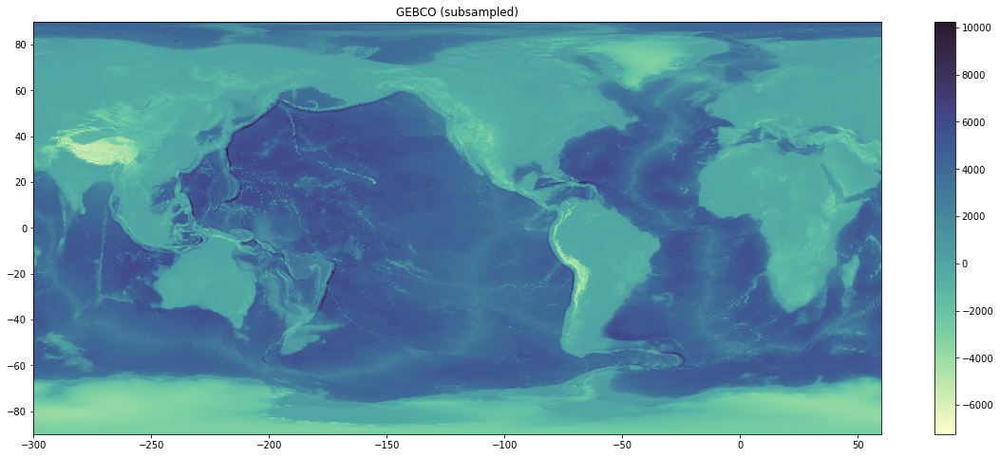

In [4]:
# GEBCO-2020 + Bedmachine combined topography 

fname_gebco  = "/archive/gold/datasets/topography/GEBCO_2023/GEBCO_2023.nc"

GEBCO = GEBCO_data(fname_gebco)

plt.figure(figsize=(20,8))
plt.pcolormesh(GEBCO.lonq[::100], GEBCO.latq[::100], GEBCO.depth[::100,::100], cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('GEBCO (subsampled)');

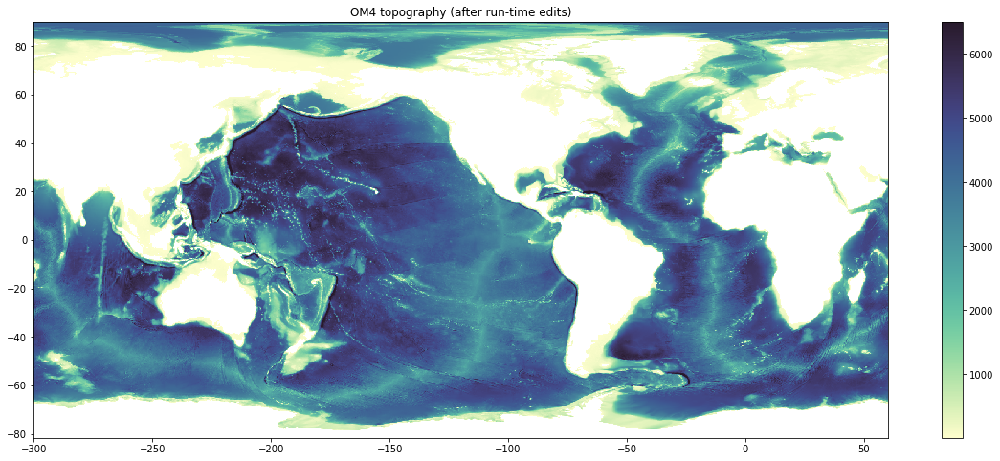

In [5]:
OM4 = OM4_data('/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_hgrid.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_static.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_mask.nc')
plt.figure(figsize=(20,8))
plt.pcolormesh(OM4.lonq, OM4.latq, OM4.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM4 topography (after run-time edits)');

OM5 longitudes are inconsistent!
OM5 latitudes are inconsistent!


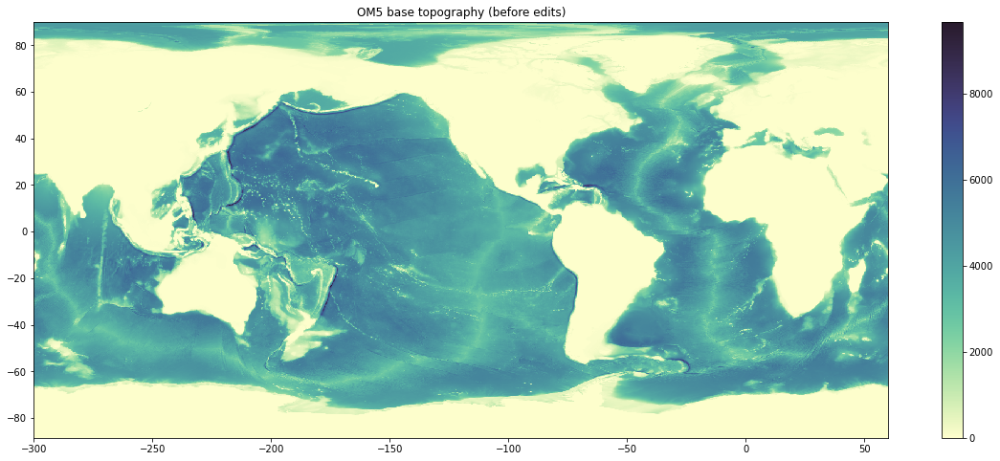

In [6]:
OM5 = OM5_data('ocean_hgrid.nc',
               'regridded_source_topog.nc')

plt.figure(figsize=(20,8))
plt.pcolormesh(OM5.lonq, OM5.latq, OM5.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM5 base topography (before edits)');

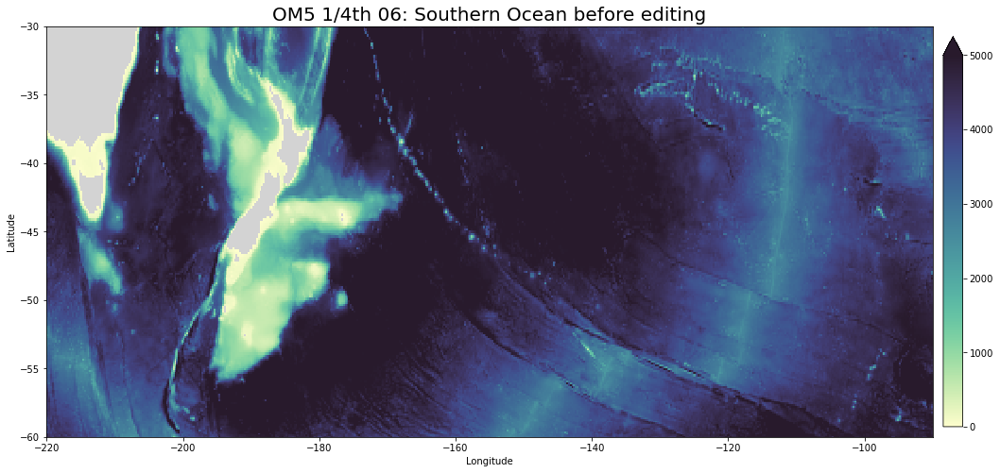

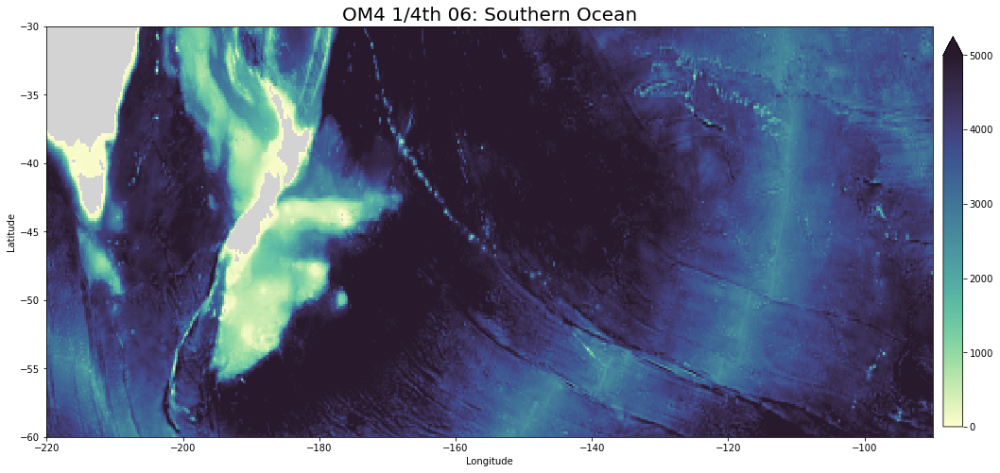

In [7]:
# Broad view of region before edits 

broadview(OM4,OM5,
          (Region_Boundaries[2],Region_Boundaries[3]),
          (Region_Boundaries[0],Region_Boundaries[1]),
          0, 5000, Region_Name, om4=True, new=False)

Gebco (js:je,is:ie) = 7199:9599,19200:21600
OM4 model (js:je,is:ie) = 200:272,318:360
OM5 model (js:je,is:ie) = 281:353,318:360
Using xlim = (-220.0, -210.0) ylim = (-60.0, -50.0)


./tools/topo_tools.py:165: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 9599:11999,19200:21600
OM4 model (js:je,is:ie) = 270:329,318:360
OM5 model (js:je,is:ie) = 351:410,318:360
Using xlim = (-220.0, -210.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,19200:21600
OM4 model (js:je,is:ie) = 327:378,318:360
OM5 model (js:je,is:ie) = 408:459,318:360
Using xlim = (-220.0, -210.0) ylim = (-40.0, -30.0)


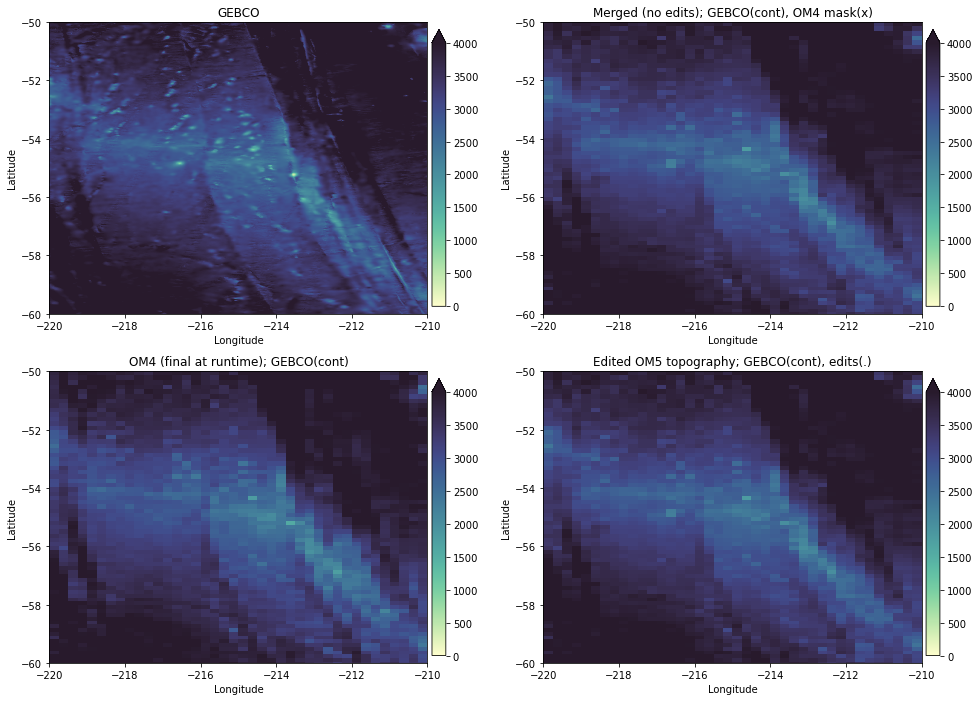

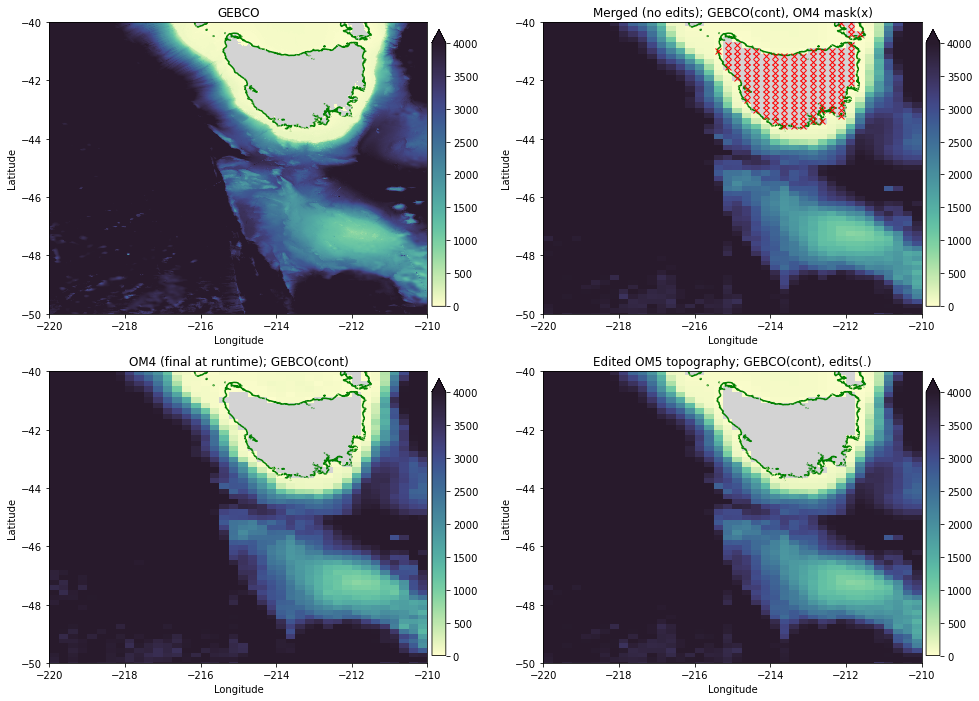

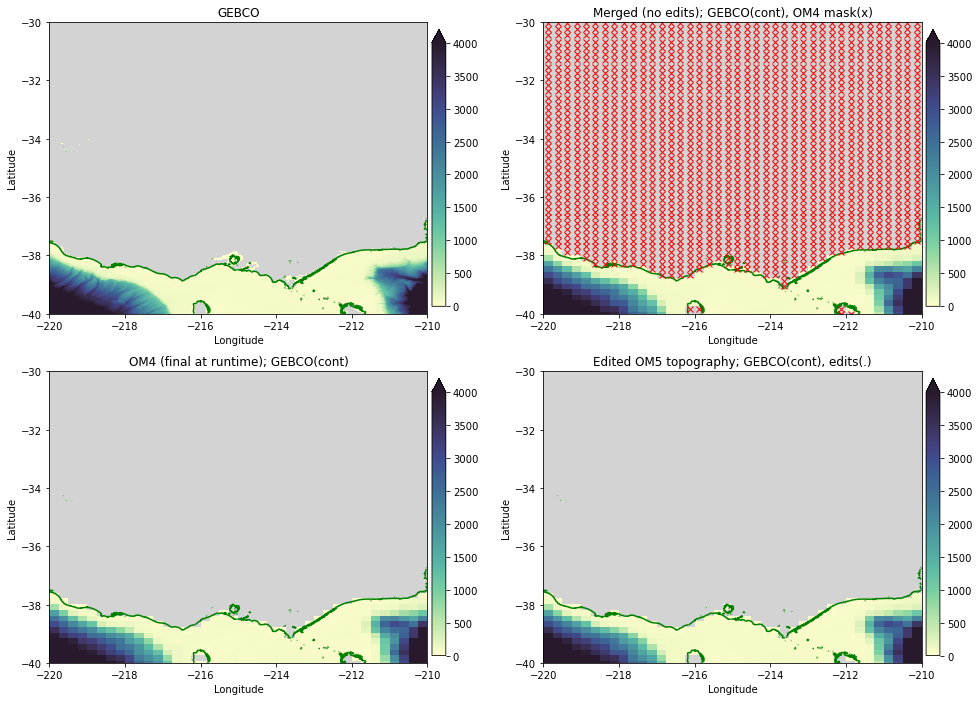

In [8]:
region = Region(-215, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-215, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-215, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 10799:12239,20040:21480
OM4 model (js:je,is:ie) = 300:334,332:358
OM5 model (js:je,is:ie) = 381:415,332:358
Using xlim = (-216.5, -210.5) ylim = (-45.0, -39.0)


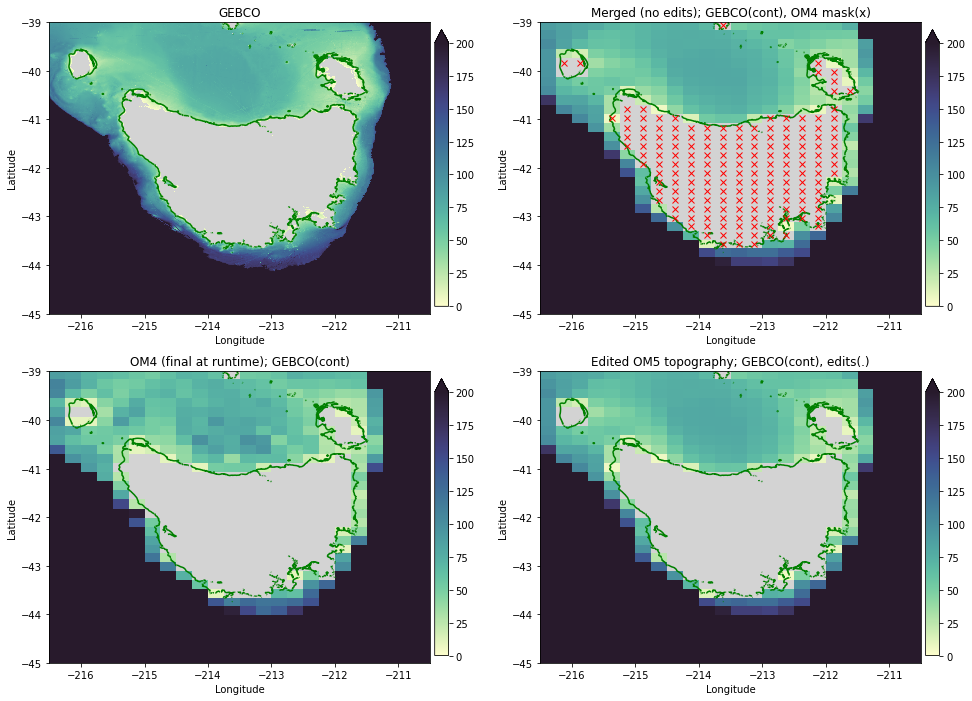

In [9]:
#Zoom in on Tasmania

region = Region(-213.5, -42, width_lon=6, width_lat=6)
map_region(region, 0, 200, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 12239:12719,20160:20640
OM4 model (js:je,is:ie) = 332:344,334:344
OM5 model (js:je,is:ie) = 413:425,334:344
Using xlim = (-216.0, -214.0) ylim = (-39.0, -37.0)


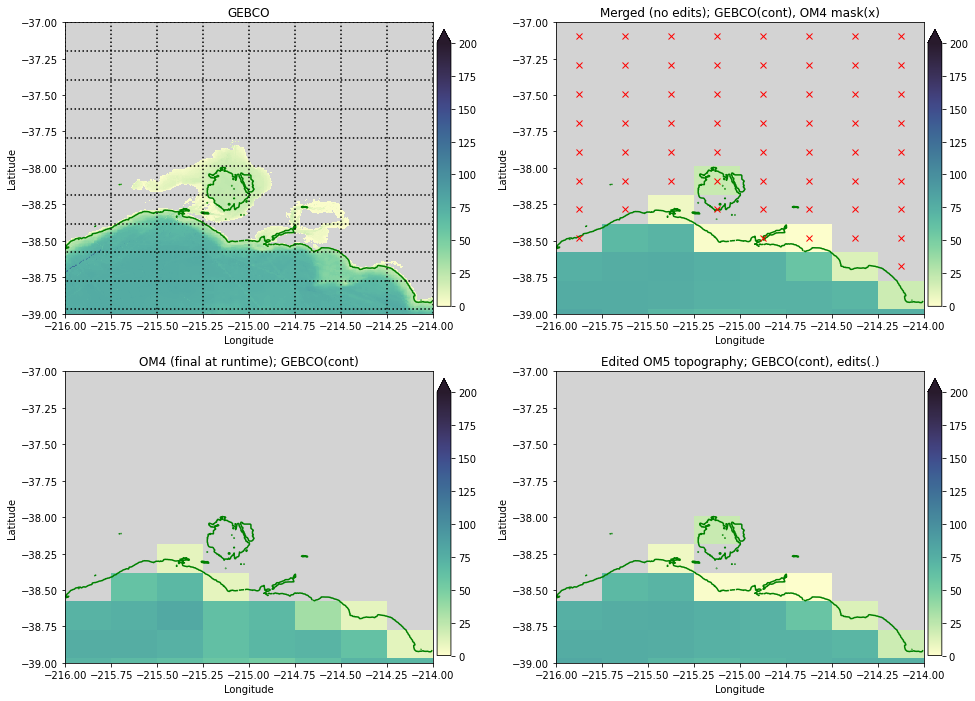

In [10]:
#Zoom into southern Australia (Melbourne)

region = Region(-215, -38, width_lon=2, width_lat=2)
map_region(region, 0, 200, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,21600:24000
OM4 model (js:je,is:ie) = 200:272,358:400
OM5 model (js:je,is:ie) = 281:353,358:400
Using xlim = (-210.0, -200.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,21600:24000
OM4 model (js:je,is:ie) = 270:329,358:400
OM5 model (js:je,is:ie) = 351:410,358:400
Using xlim = (-210.0, -200.0) ylim = (-50.0, -40.0)


./tools/topo_tools.py:165: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 11999:14399,21600:24000
OM4 model (js:je,is:ie) = 327:378,358:400
OM5 model (js:je,is:ie) = 408:459,358:400
Using xlim = (-210.0, -200.0) ylim = (-40.0, -30.0)


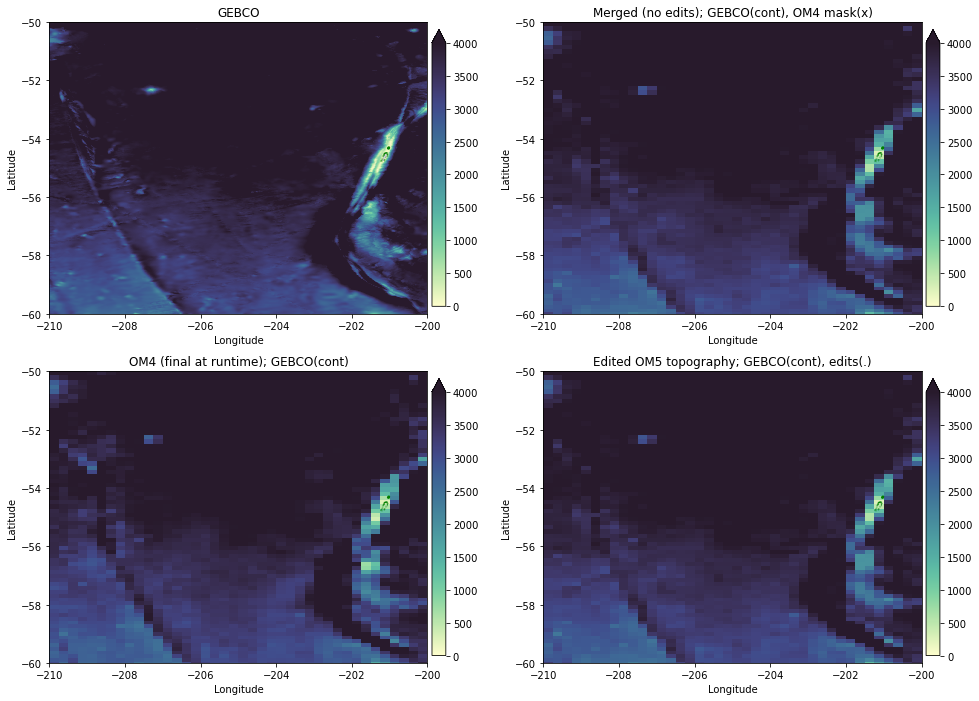

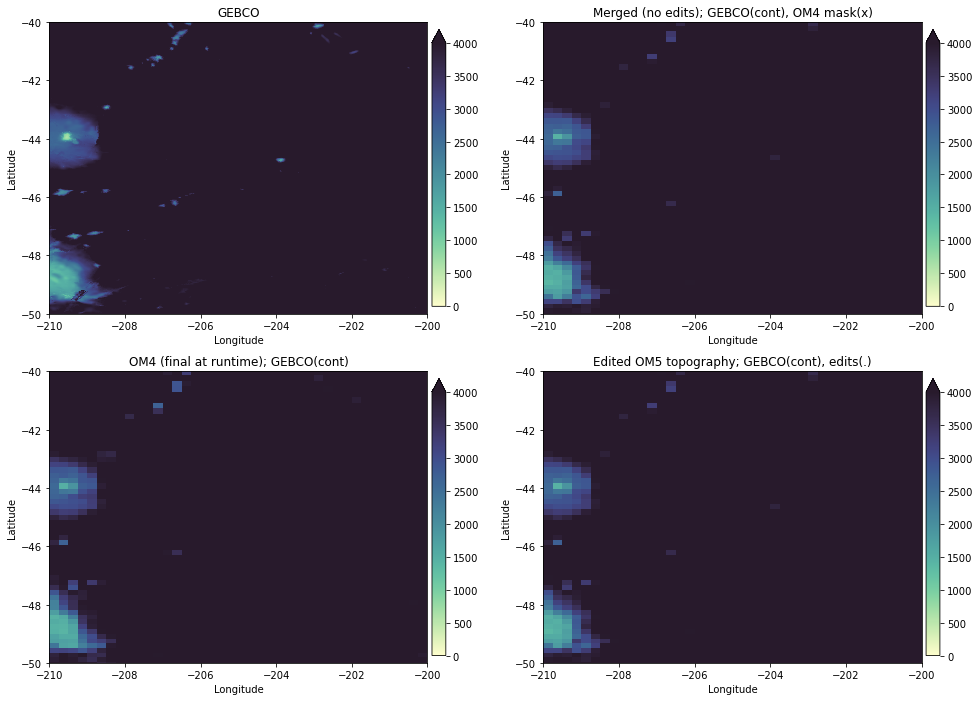

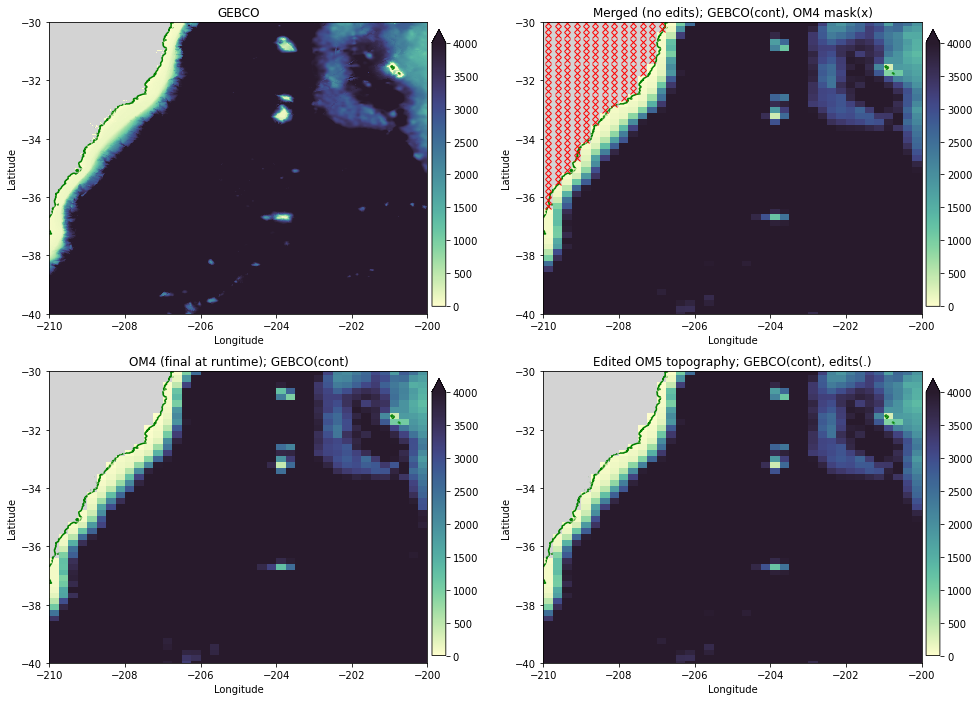

In [11]:
region = Region(-205, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-205, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-205, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,24000:26400
OM4 model (js:je,is:ie) = 200:272,398:440
OM5 model (js:je,is:ie) = 281:353,398:440
Using xlim = (-200.0, -190.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,24000:26400
OM4 model (js:je,is:ie) = 270:329,398:440
OM5 model (js:je,is:ie) = 351:410,398:440
Using xlim = (-200.0, -190.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,24000:26400
OM4 model (js:je,is:ie) = 327:378,398:440
OM5 model (js:je,is:ie) = 408:459,398:440
Using xlim = (-200.0, -190.0) ylim = (-40.0, -30.0)


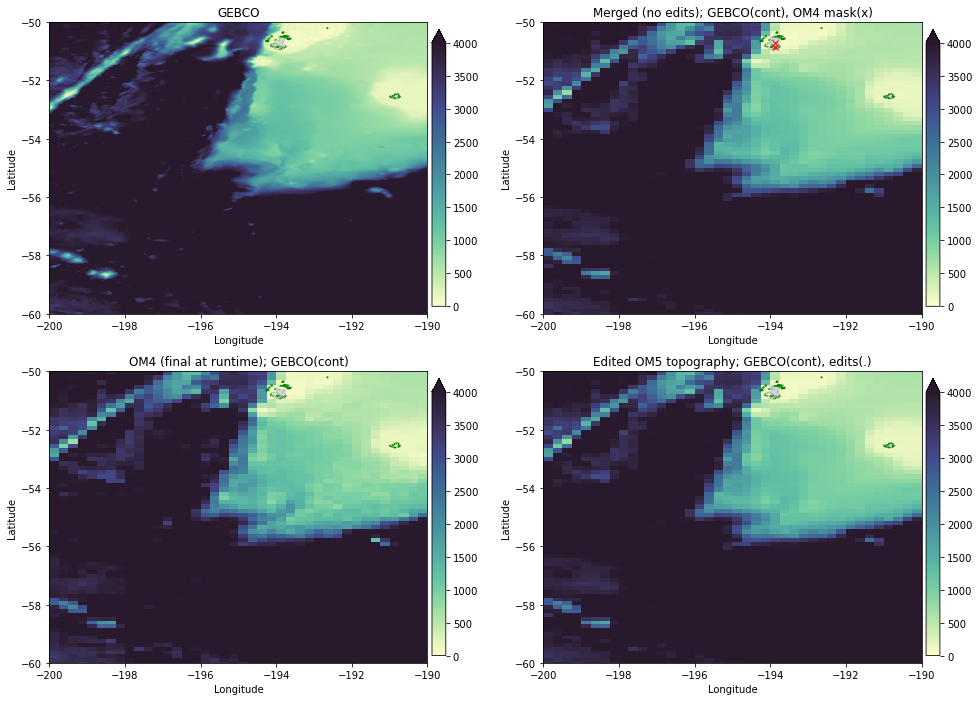

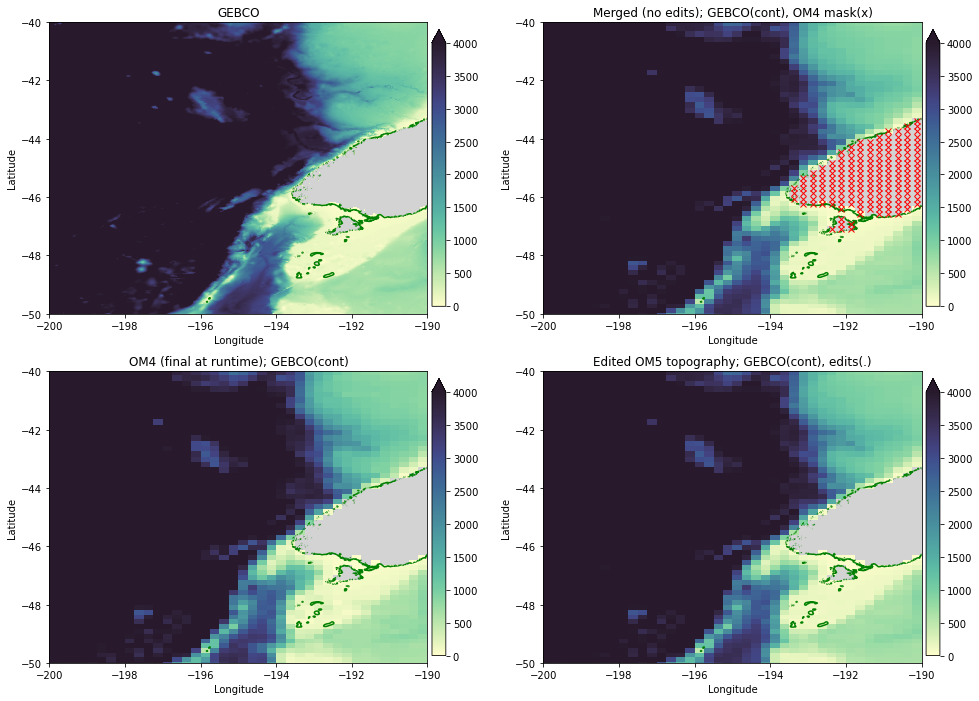

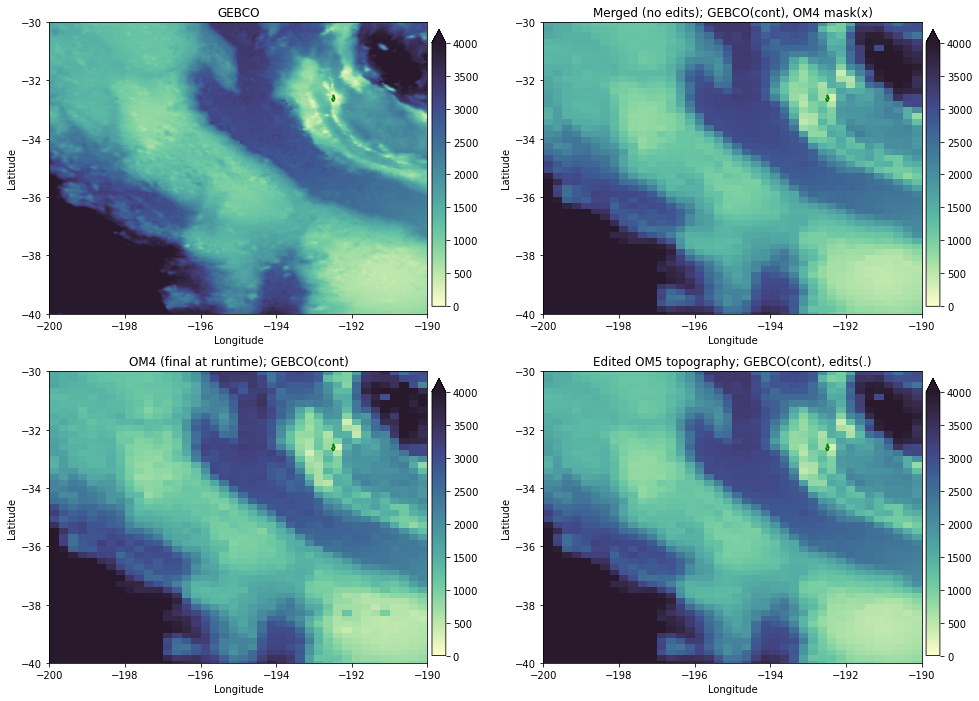

In [12]:
region = Region(-195, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-195, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-195, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,26400:28799
OM4 model (js:je,is:ie) = 200:272,438:480
OM5 model (js:je,is:ie) = 281:353,438:480
Using xlim = (-190.0, -180.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,26400:28799
OM4 model (js:je,is:ie) = 270:329,438:480
OM5 model (js:je,is:ie) = 351:410,438:480
Using xlim = (-190.0, -180.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,26400:28799
OM4 model (js:je,is:ie) = 327:378,438:480
OM5 model (js:je,is:ie) = 408:459,438:480
Using xlim = (-190.0, -180.0) ylim = (-40.0, -30.0)


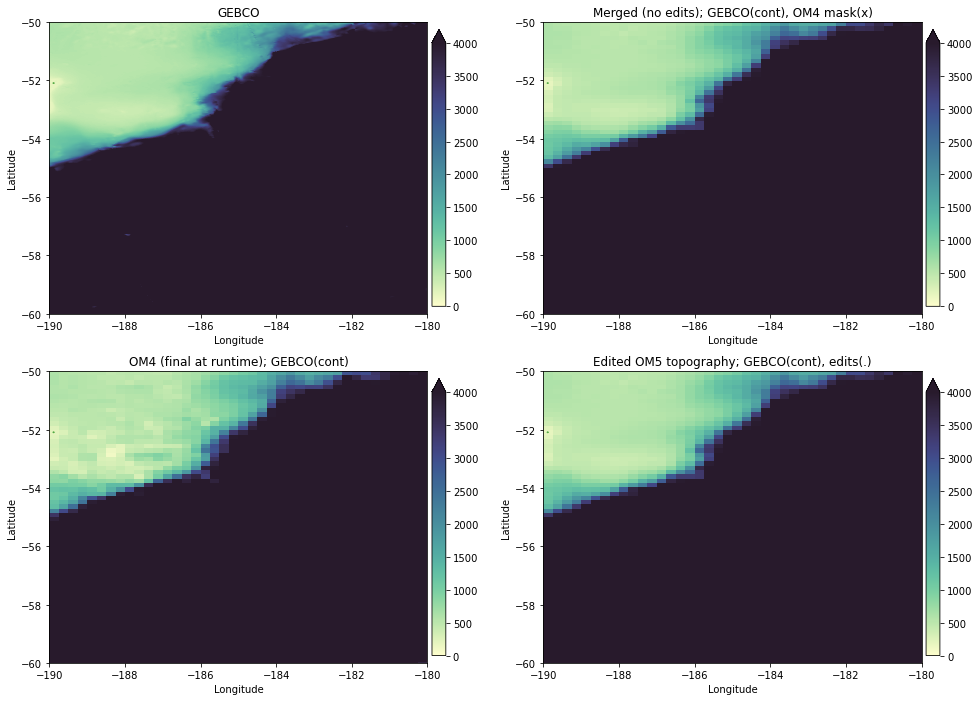

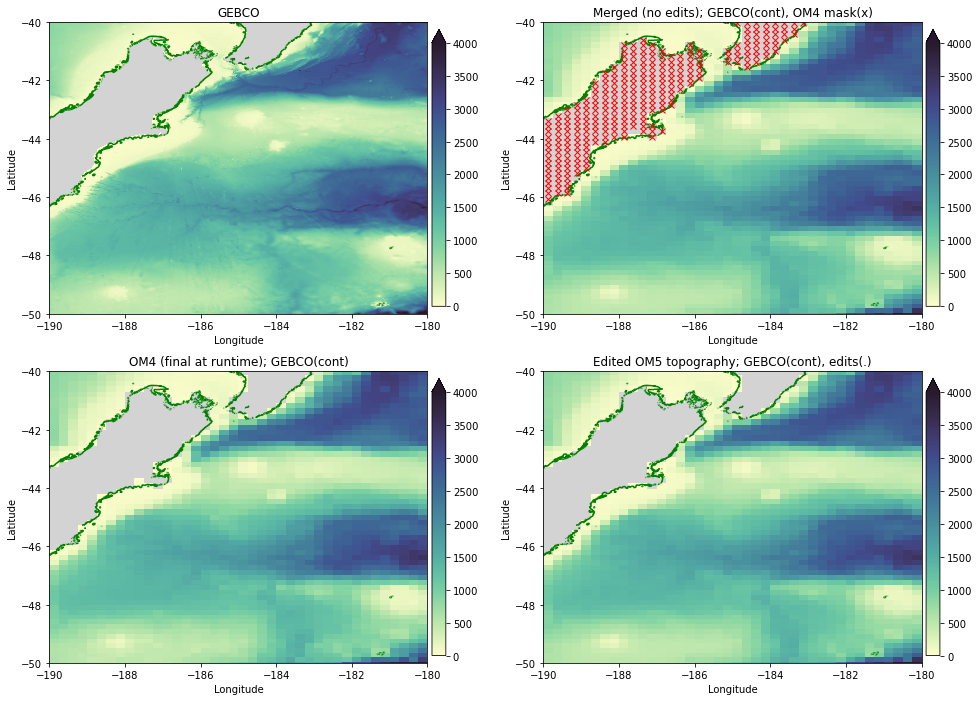

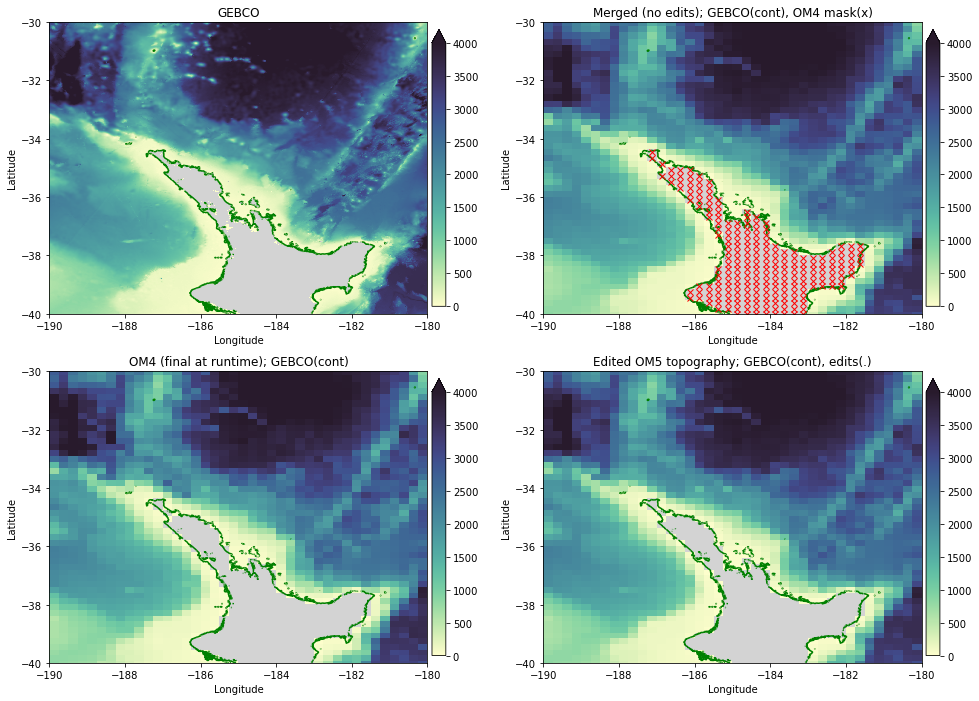

In [13]:
region = Region(-185, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-185, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-185, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 10679:11399,26520:27240
OM4 model (js:je,is:ie) = 297:316,440:454
OM5 model (js:je,is:ie) = 378:397,440:454
Using xlim = (-189.5, -186.5) ylim = (-45.5, -42.5)


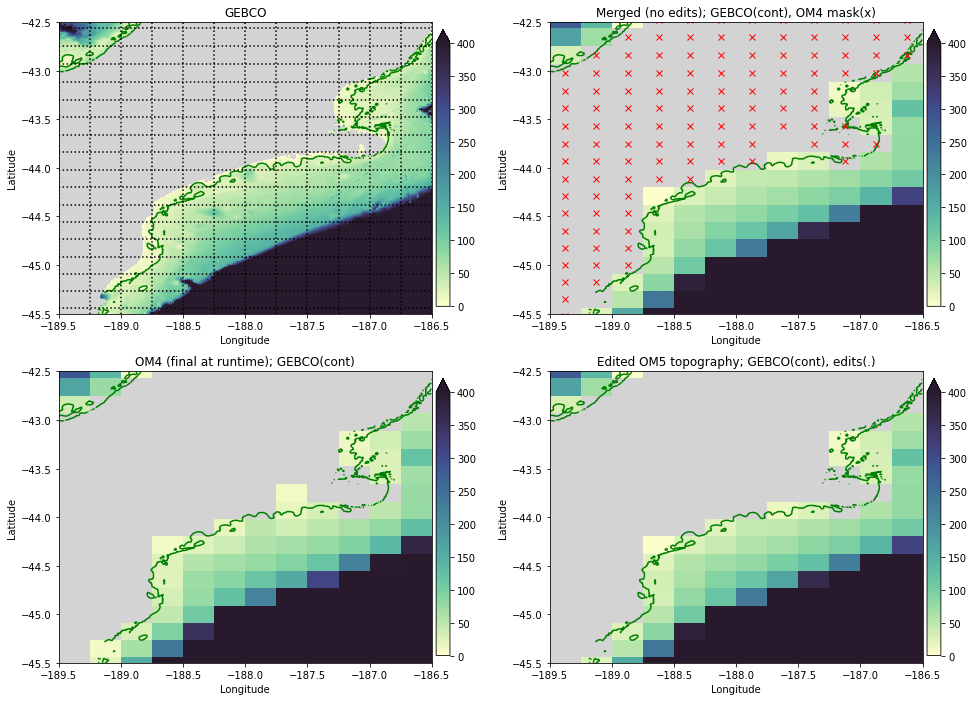

In [14]:
region = Region(-188, -44, width_lon=3, width_lat=3)
map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 11399:12119,27000:27720
OM4 model (js:je,is:ie) = 314:332,448:462
OM5 model (js:je,is:ie) = 395:413,448:462
Using xlim = (-187.5, -184.5) ylim = (-42.5, -39.5)


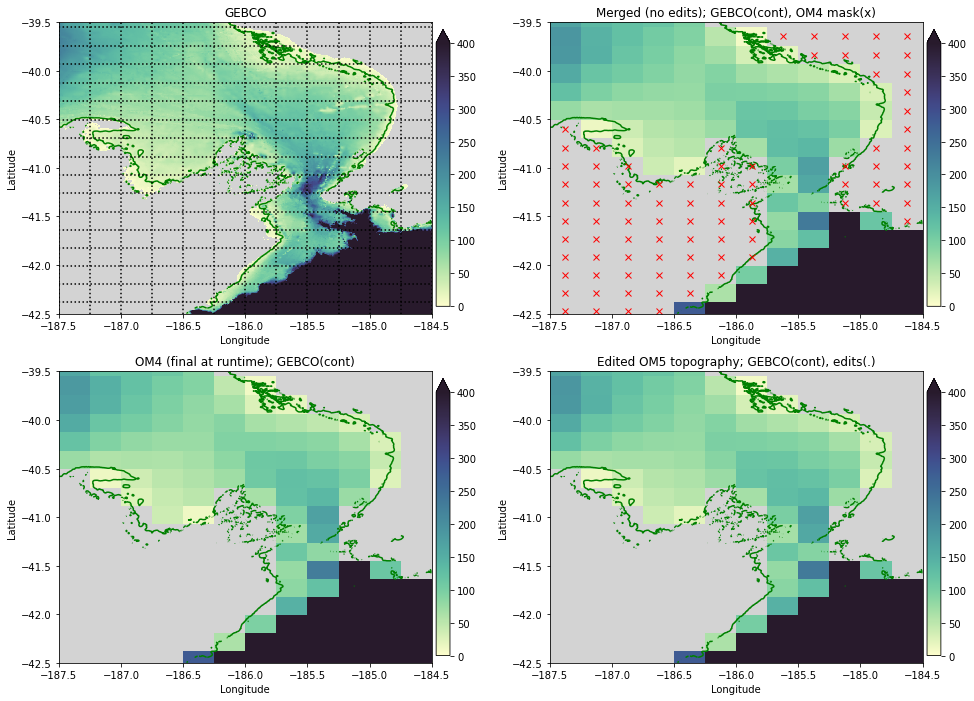

In [15]:
region = Region(-186, -41, width_lon=3, width_lat=3)
map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,28799:31199
OM4 model (js:je,is:ie) = 200:272,478:520
OM5 model (js:je,is:ie) = 281:353,478:520
Using xlim = (-180.0, -170.0) ylim = (-60.0, -50.0)


./tools/topo_tools.py:165: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 9599:11999,28799:31199
OM4 model (js:je,is:ie) = 270:329,478:520
OM5 model (js:je,is:ie) = 351:410,478:520
Using xlim = (-180.0, -170.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,28799:31199
OM4 model (js:je,is:ie) = 327:378,478:520
OM5 model (js:je,is:ie) = 408:459,478:520
Using xlim = (-180.0, -170.0) ylim = (-40.0, -30.0)


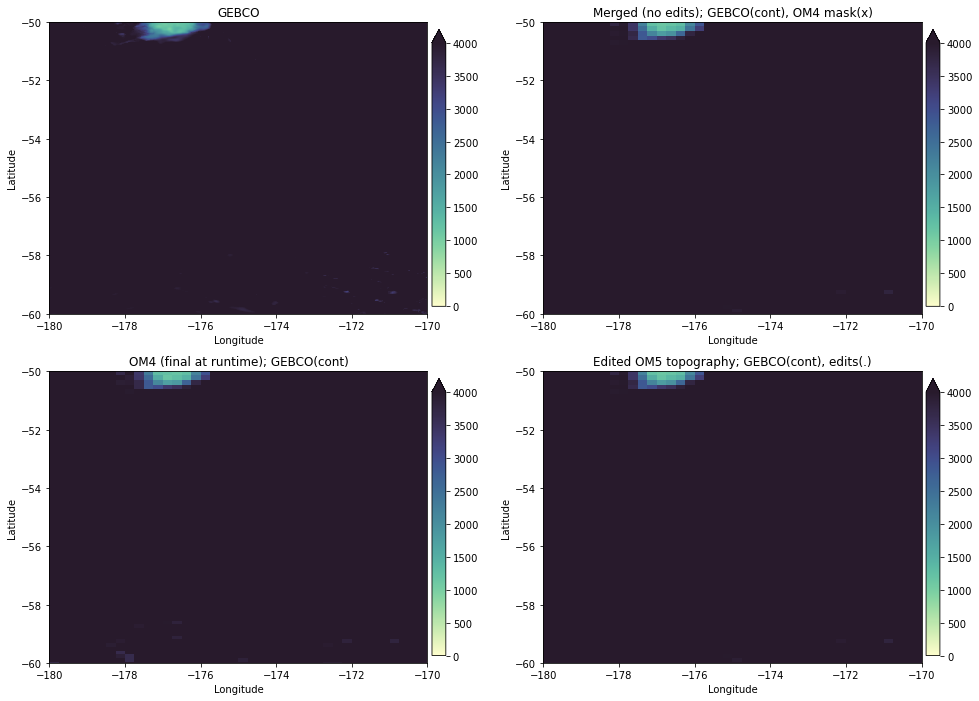

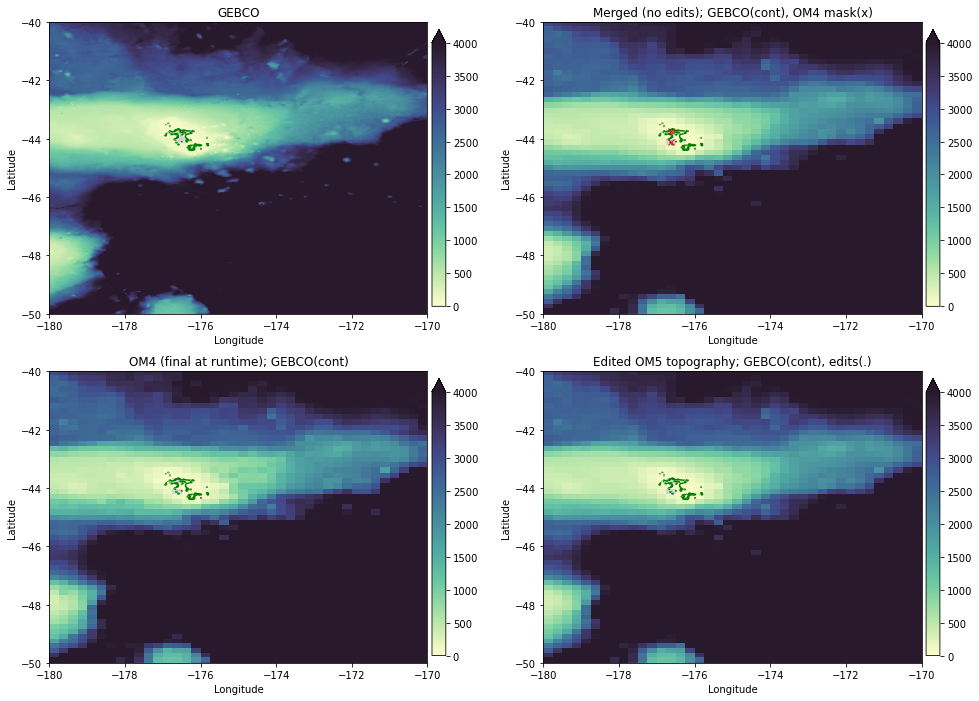

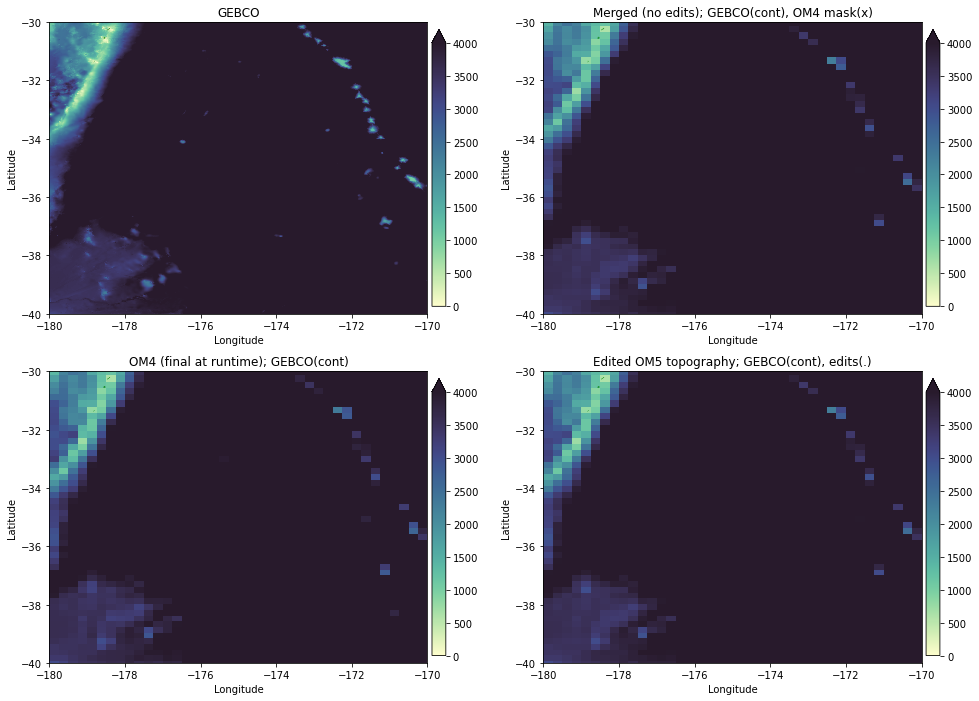

In [16]:
region = Region(-175, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-175, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-175, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 10679:11399,29399:30119
OM4 model (js:je,is:ie) = 297:316,488:502
OM5 model (js:je,is:ie) = 378:397,488:502
Using xlim = (-177.5, -174.5) ylim = (-45.5, -42.5)


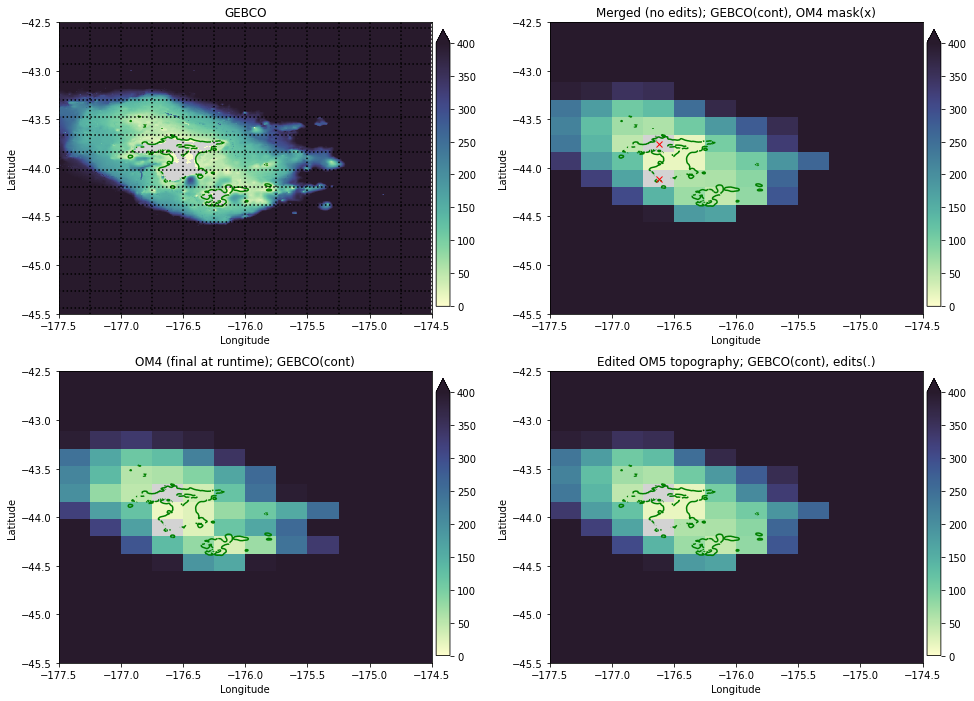

In [17]:
#Chatham Island

region = Region(-176, -44, width_lon=3, width_lat=3)

map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

#No edits needed

Gebco (js:je,is:ie) = 7199:9599,31199:33599
OM4 model (js:je,is:ie) = 200:272,518:560
OM5 model (js:je,is:ie) = 281:353,518:560
Using xlim = (-170.0, -160.0) ylim = (-60.0, -50.0)


./tools/topo_tools.py:165: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 9599:11999,31199:33599
OM4 model (js:je,is:ie) = 270:329,518:560
OM5 model (js:je,is:ie) = 351:410,518:560
Using xlim = (-170.0, -160.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,31199:33599
OM4 model (js:je,is:ie) = 327:378,518:560
OM5 model (js:je,is:ie) = 408:459,518:560
Using xlim = (-170.0, -160.0) ylim = (-40.0, -30.0)


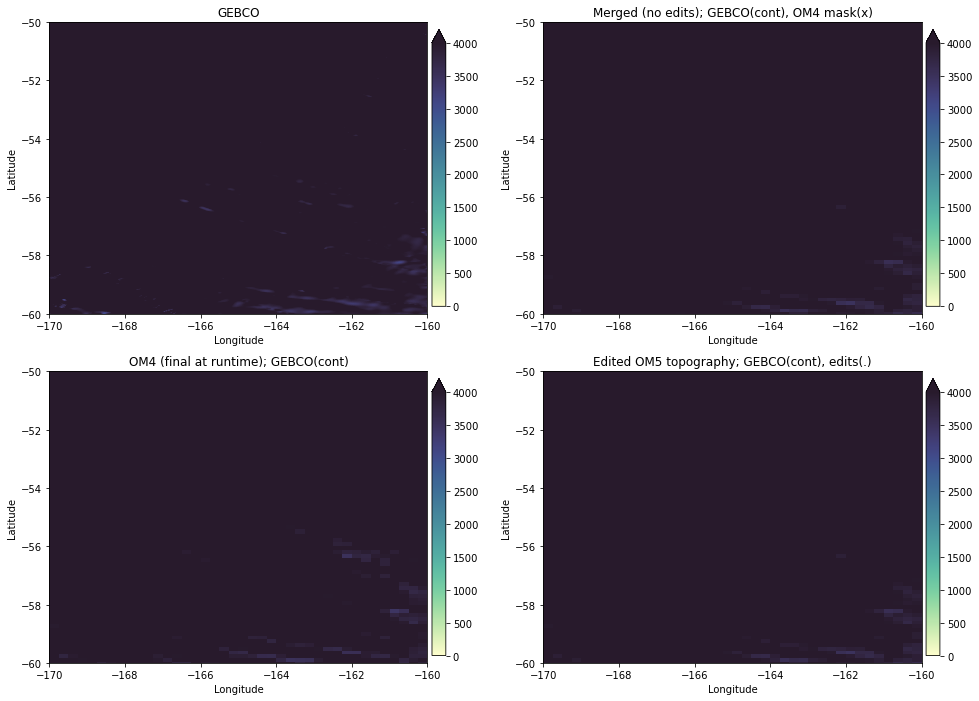

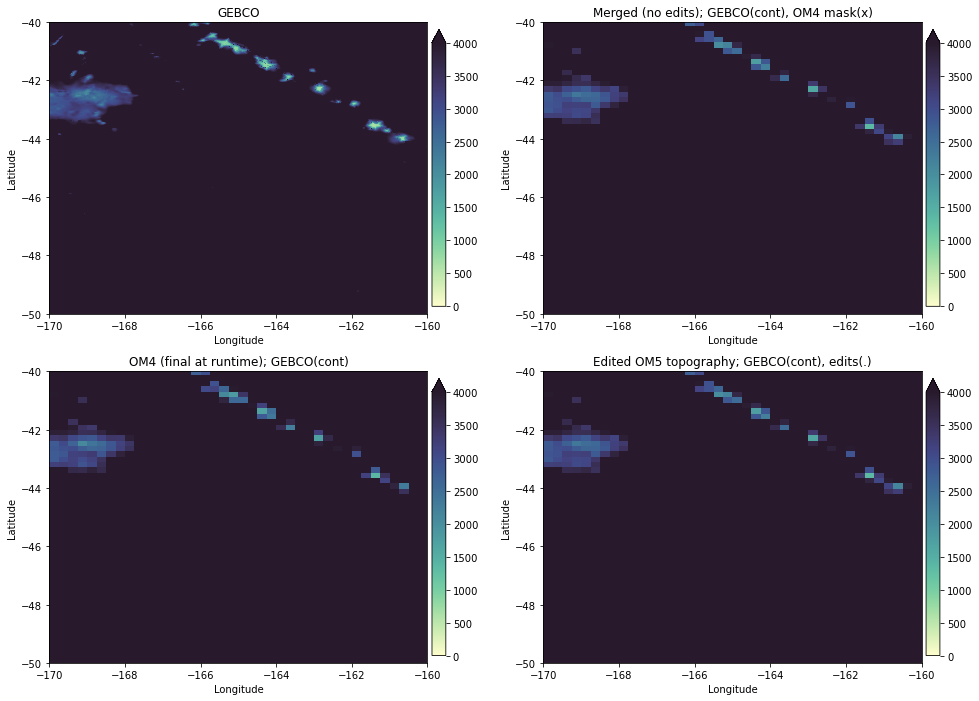

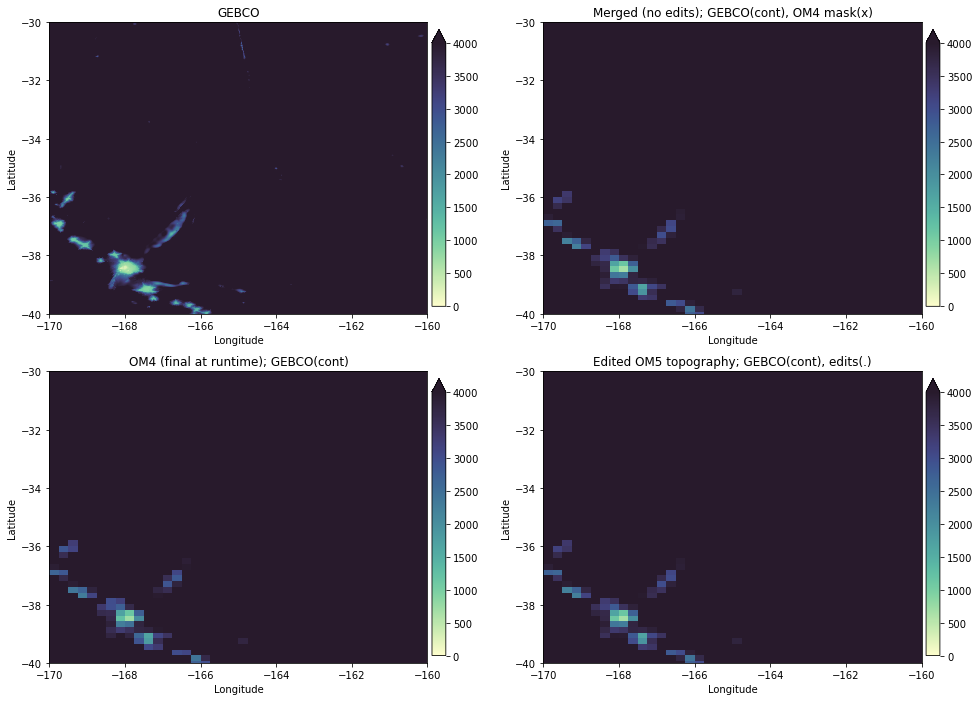

In [18]:
region = Region(-165, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-165, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-165, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,33599:35999
OM4 model (js:je,is:ie) = 200:272,558:600
OM5 model (js:je,is:ie) = 281:353,558:600
Using xlim = (-160.0, -150.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,33599:35999
OM4 model (js:je,is:ie) = 270:329,558:600
OM5 model (js:je,is:ie) = 351:410,558:600
Using xlim = (-160.0, -150.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,33599:35999
OM4 model (js:je,is:ie) = 327:378,558:600
OM5 model (js:je,is:ie) = 408:459,558:600
Using xlim = (-160.0, -150.0) ylim = (-40.0, -30.0)


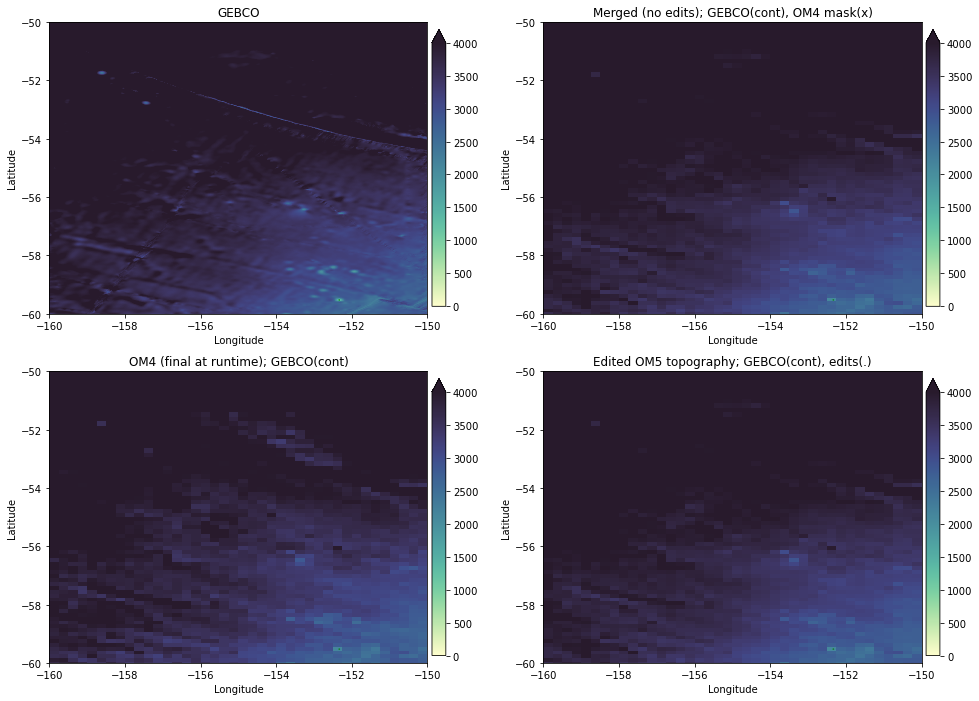

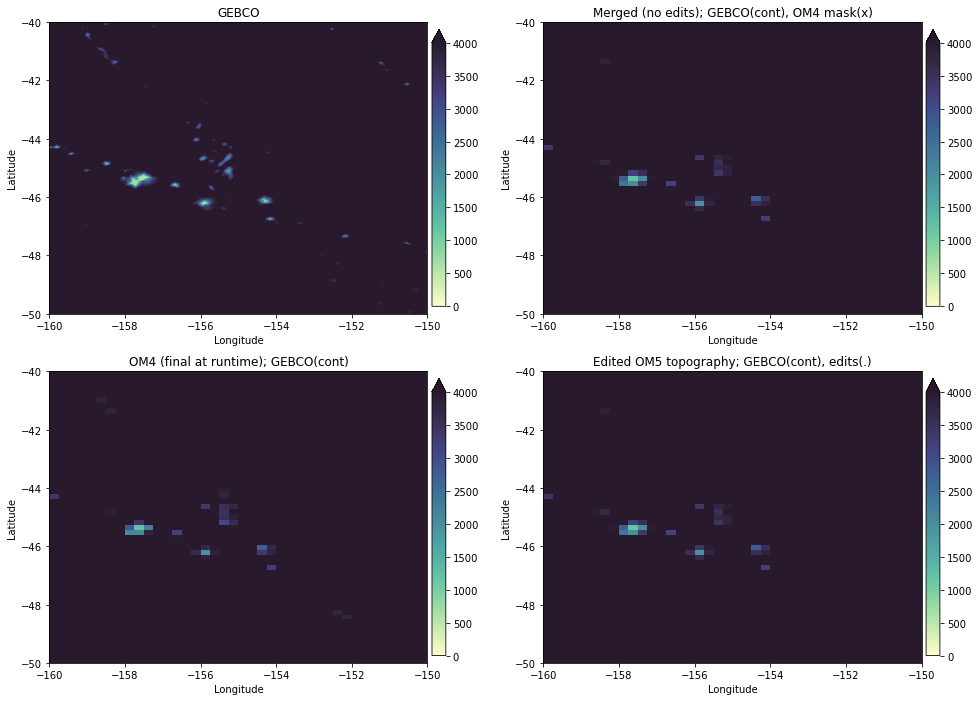

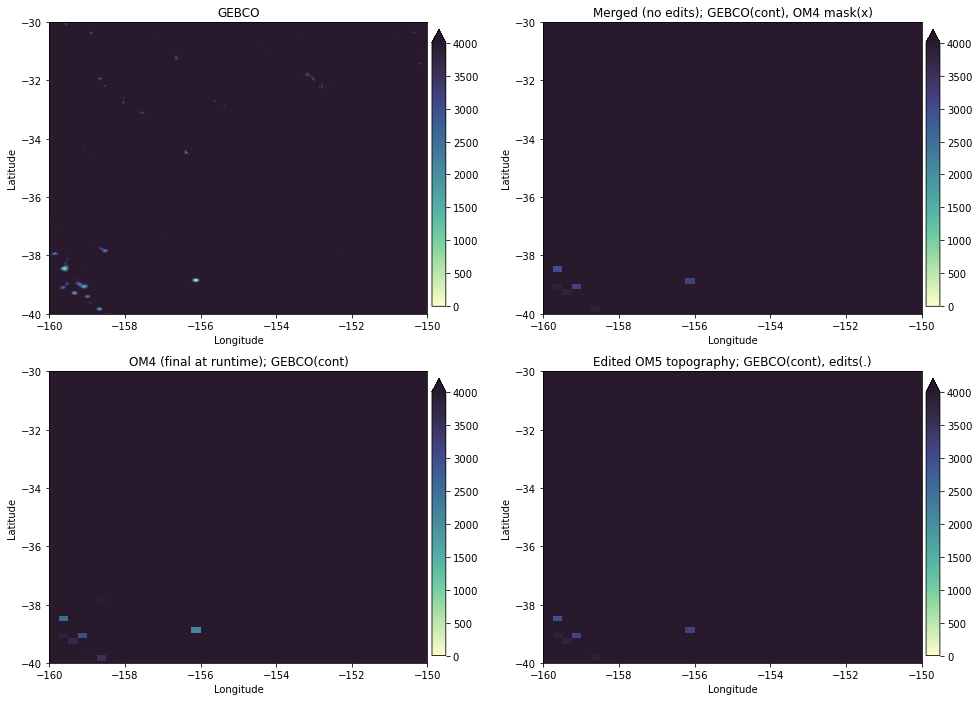

In [19]:
region = Region(-155, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-155, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-155, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,35999:38399
OM4 model (js:je,is:ie) = 200:272,598:640
OM5 model (js:je,is:ie) = 281:353,598:640
Using xlim = (-150.0, -140.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,35999:38399
OM4 model (js:je,is:ie) = 270:329,598:640
OM5 model (js:je,is:ie) = 351:410,598:640
Using xlim = (-150.0, -140.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,35999:38399
OM4 model (js:je,is:ie) = 327:378,598:640
OM5 model (js:je,is:ie) = 408:459,598:640
Using xlim = (-150.0, -140.0) ylim = (-40.0, -30.0)


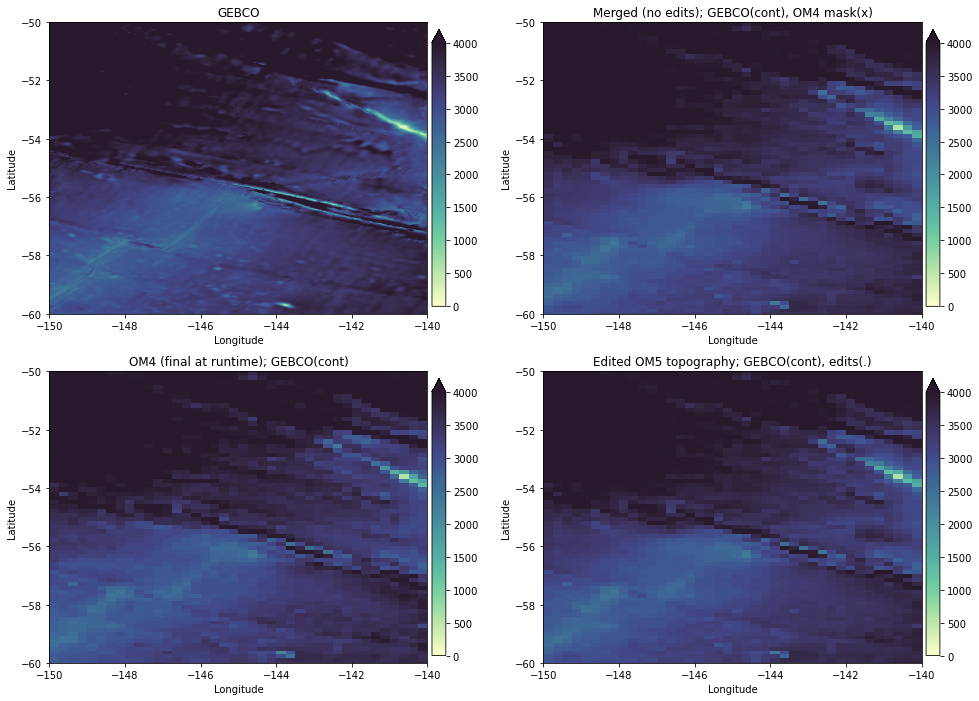

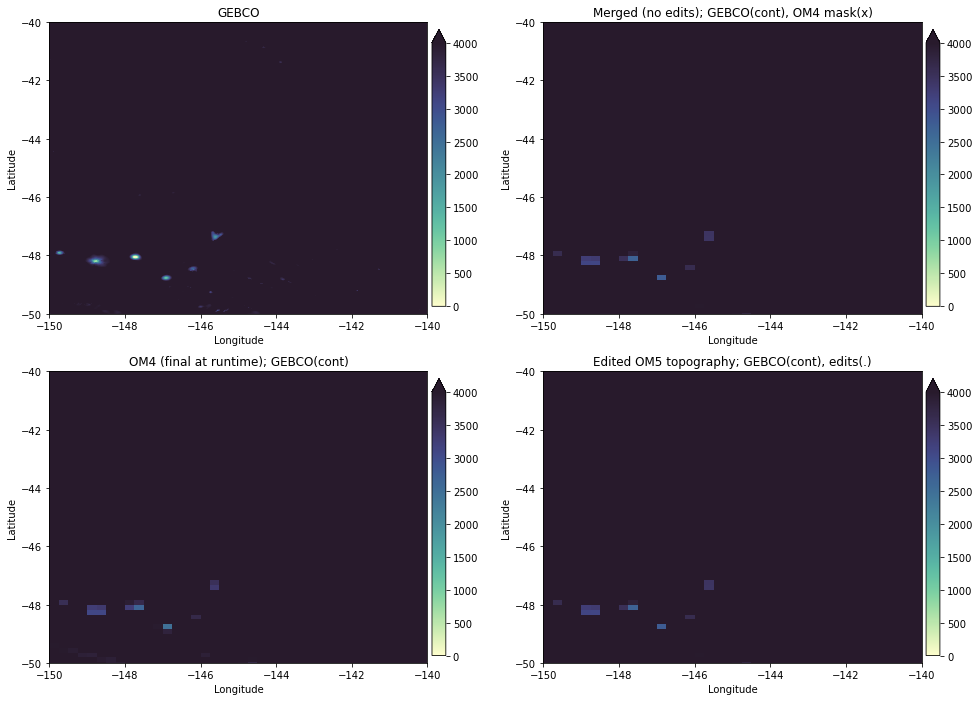

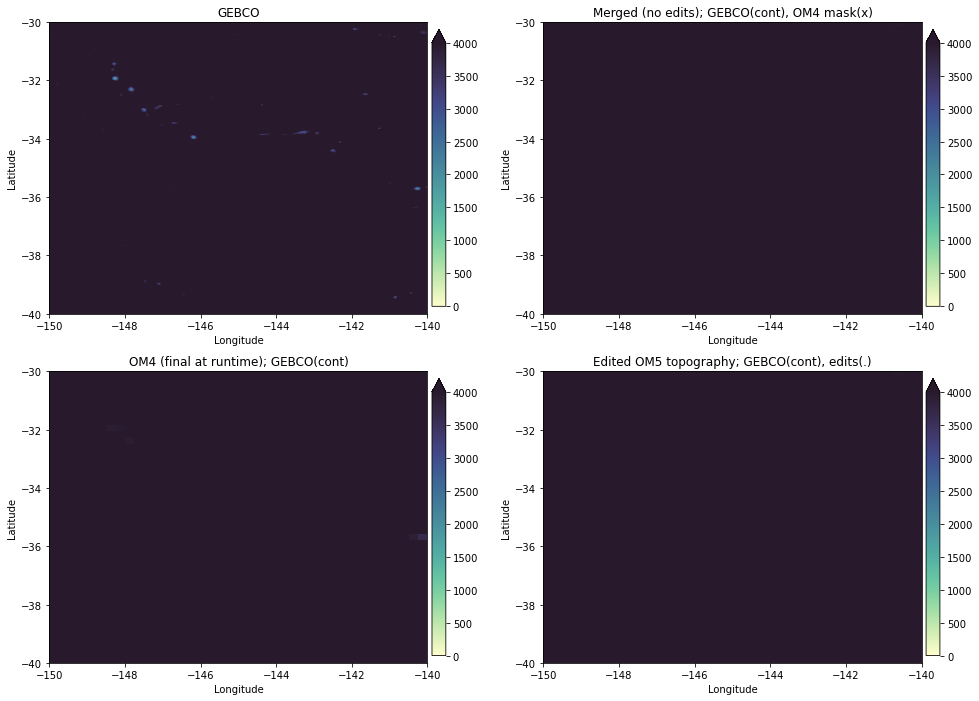

In [20]:
region = Region(-145, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-145, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-145, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,38399:40799
OM4 model (js:je,is:ie) = 200:272,638:680
OM5 model (js:je,is:ie) = 281:353,638:680
Using xlim = (-140.0, -130.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,38399:40799
OM4 model (js:je,is:ie) = 270:329,638:680
OM5 model (js:je,is:ie) = 351:410,638:680
Using xlim = (-140.0, -130.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,38399:40799
OM4 model (js:je,is:ie) = 327:378,638:680
OM5 model (js:je,is:ie) = 408:459,638:680
Using xlim = (-140.0, -130.0) ylim = (-40.0, -30.0)


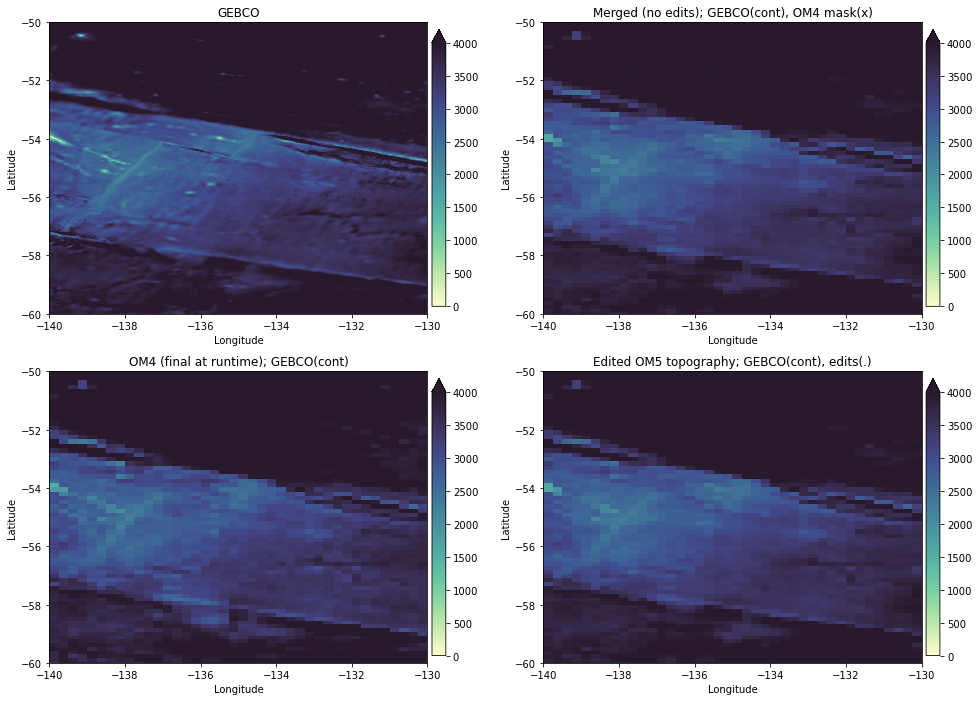

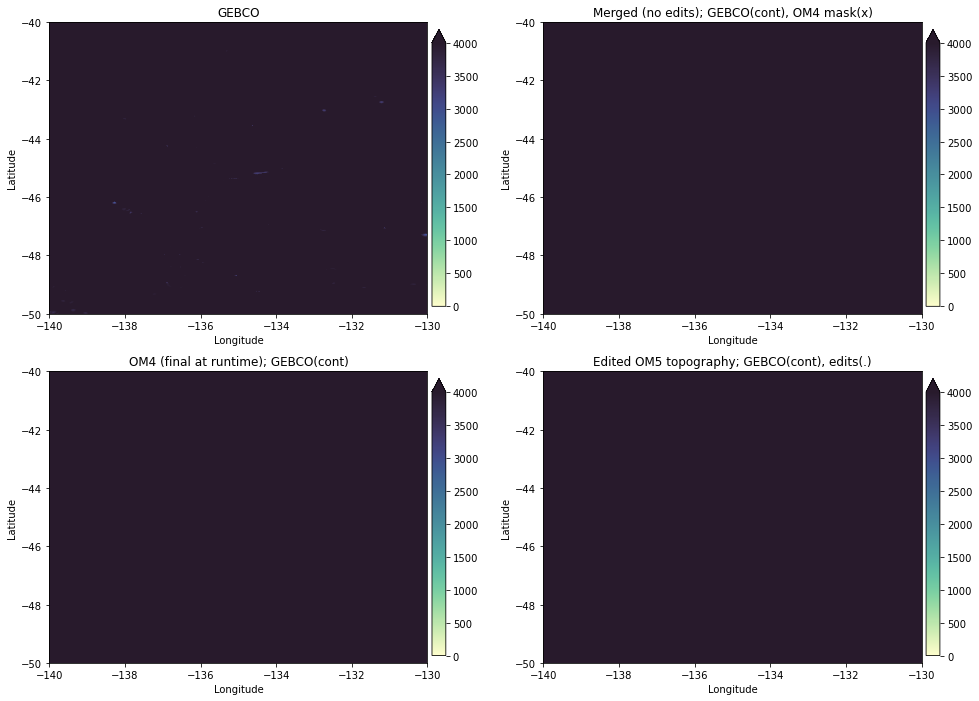

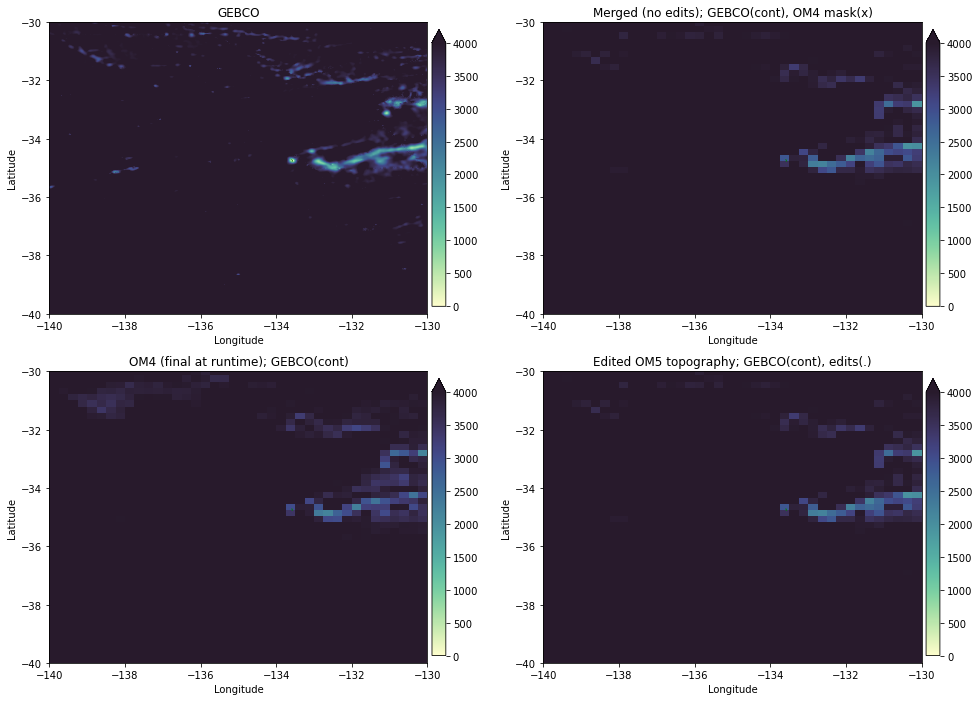

In [21]:
region = Region(-135, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-135, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-135, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,40799:43199
OM4 model (js:je,is:ie) = 200:272,678:720
OM5 model (js:je,is:ie) = 281:353,678:720
Using xlim = (-130.0, -120.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,40799:43199
OM4 model (js:je,is:ie) = 270:329,678:720
OM5 model (js:je,is:ie) = 351:410,678:720
Using xlim = (-130.0, -120.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,40799:43199
OM4 model (js:je,is:ie) = 327:378,678:720
OM5 model (js:je,is:ie) = 408:459,678:720
Using xlim = (-130.0, -120.0) ylim = (-40.0, -30.0)


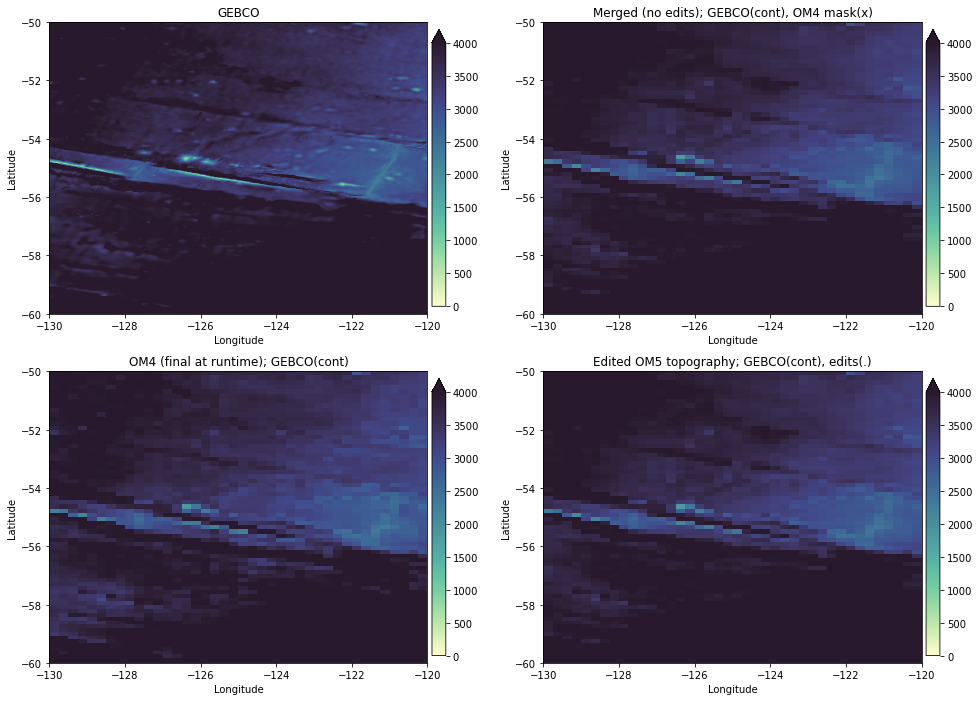

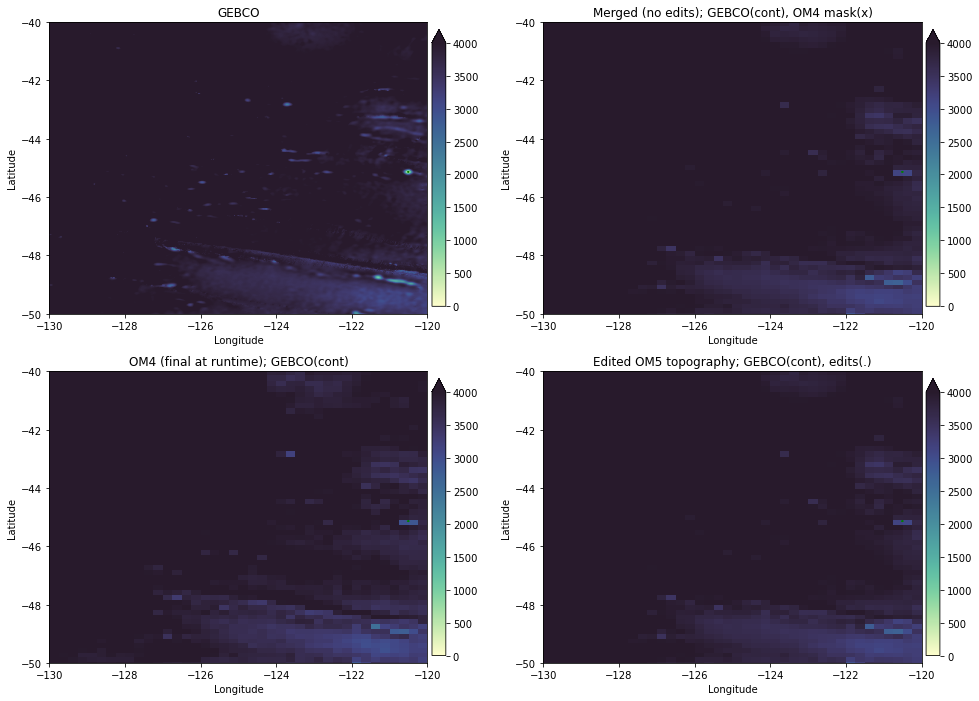

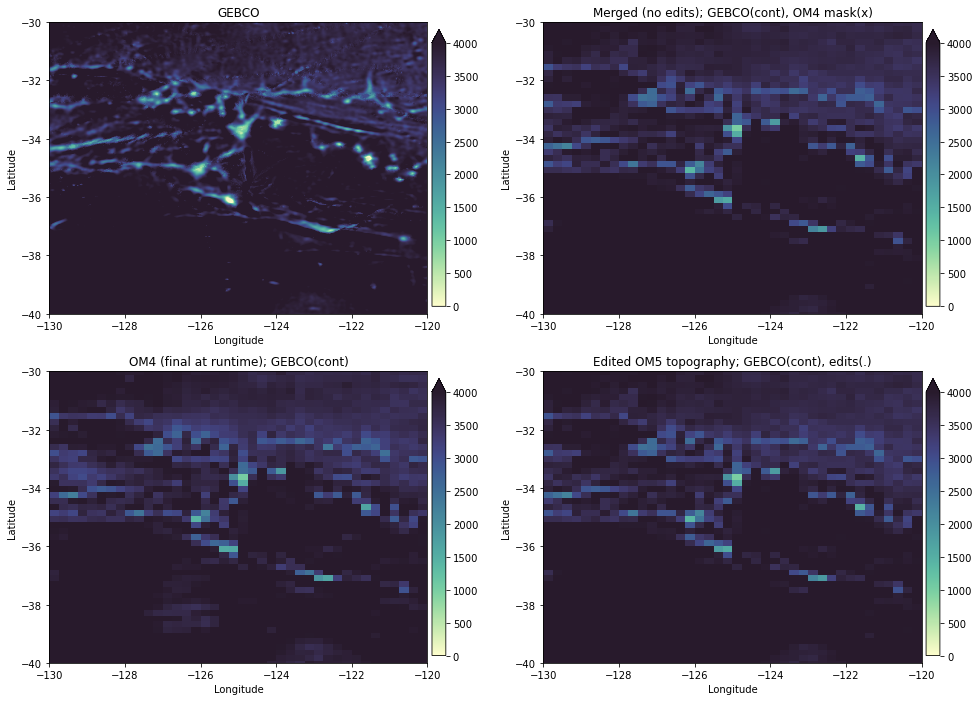

In [22]:
region = Region(-125, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-125, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-125, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,40799:43199
OM4 model (js:je,is:ie) = 200:272,678:720
OM5 model (js:je,is:ie) = 281:353,678:720
Using xlim = (-130.0, -120.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,40799:43199
OM4 model (js:je,is:ie) = 270:329,678:720
OM5 model (js:je,is:ie) = 351:410,678:720
Using xlim = (-130.0, -120.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,40799:43199
OM4 model (js:je,is:ie) = 327:378,678:720
OM5 model (js:je,is:ie) = 408:459,678:720
Using xlim = (-130.0, -120.0) ylim = (-40.0, -30.0)


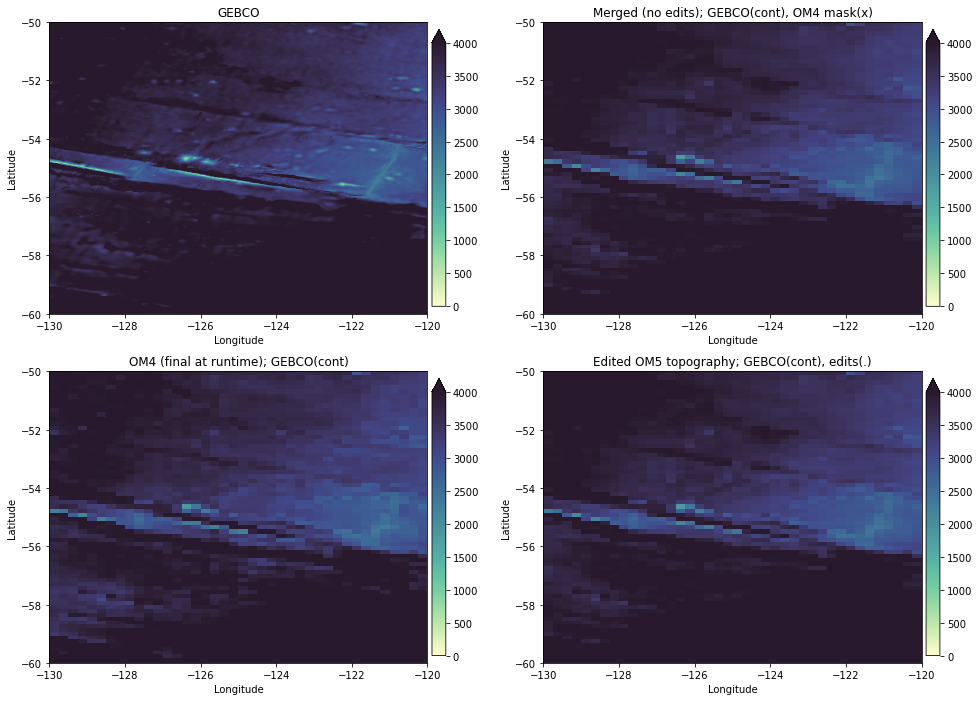

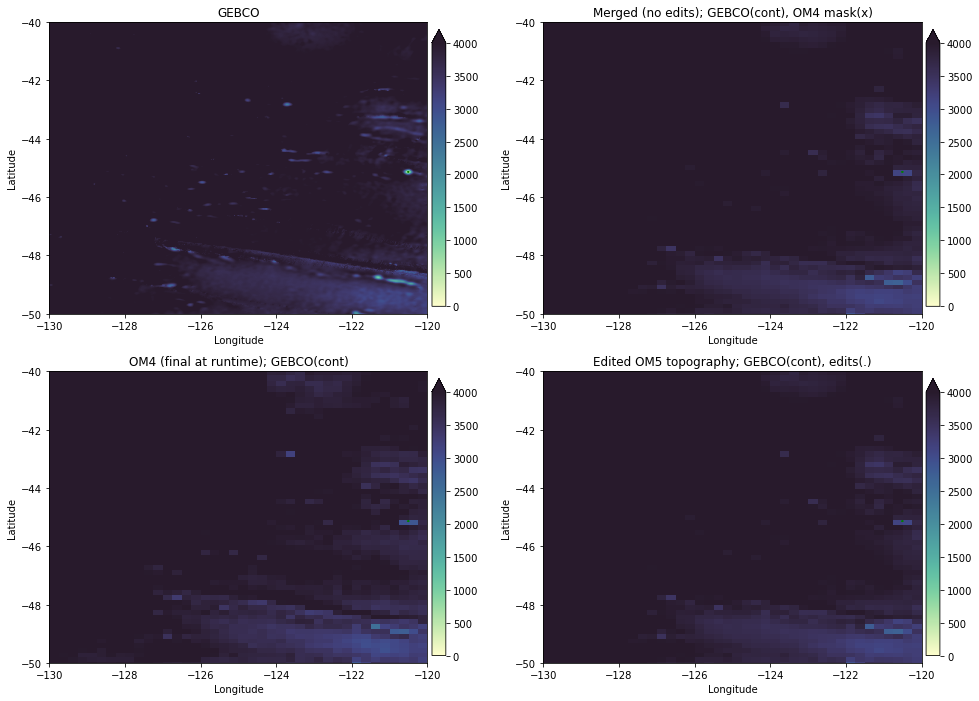

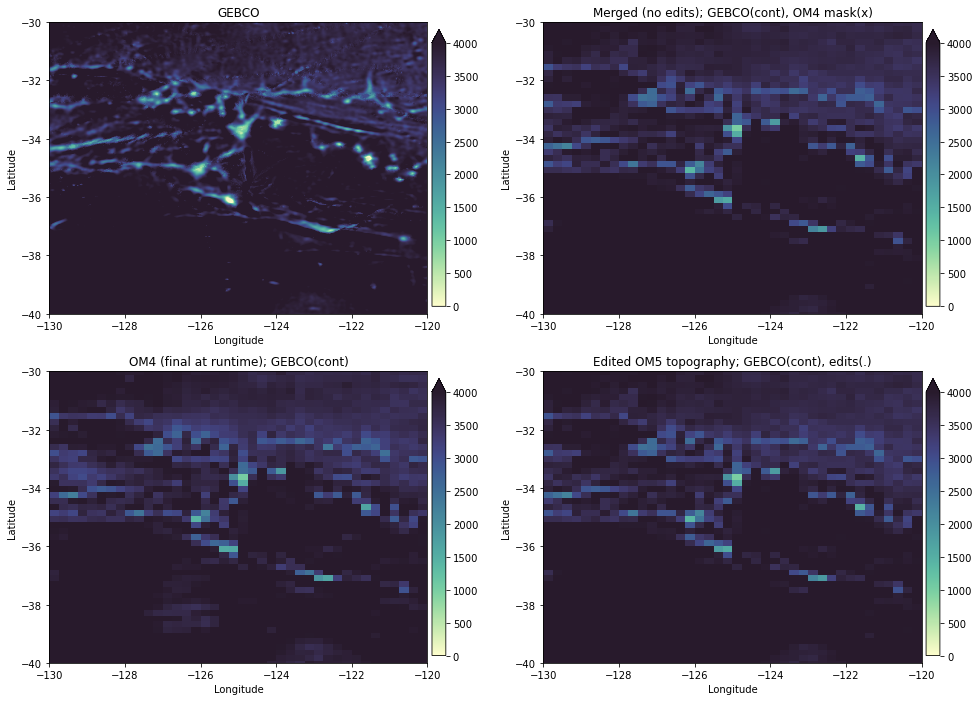

In [23]:
region = Region(-125, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-125, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-125, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,43199:45599
OM4 model (js:je,is:ie) = 200:272,718:760
OM5 model (js:je,is:ie) = 281:353,718:760
Using xlim = (-120.0, -110.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,43199:45599
OM4 model (js:je,is:ie) = 270:329,718:760
OM5 model (js:je,is:ie) = 351:410,718:760
Using xlim = (-120.0, -110.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,43199:45599
OM4 model (js:je,is:ie) = 327:378,718:760
OM5 model (js:je,is:ie) = 408:459,718:760
Using xlim = (-120.0, -110.0) ylim = (-40.0, -30.0)


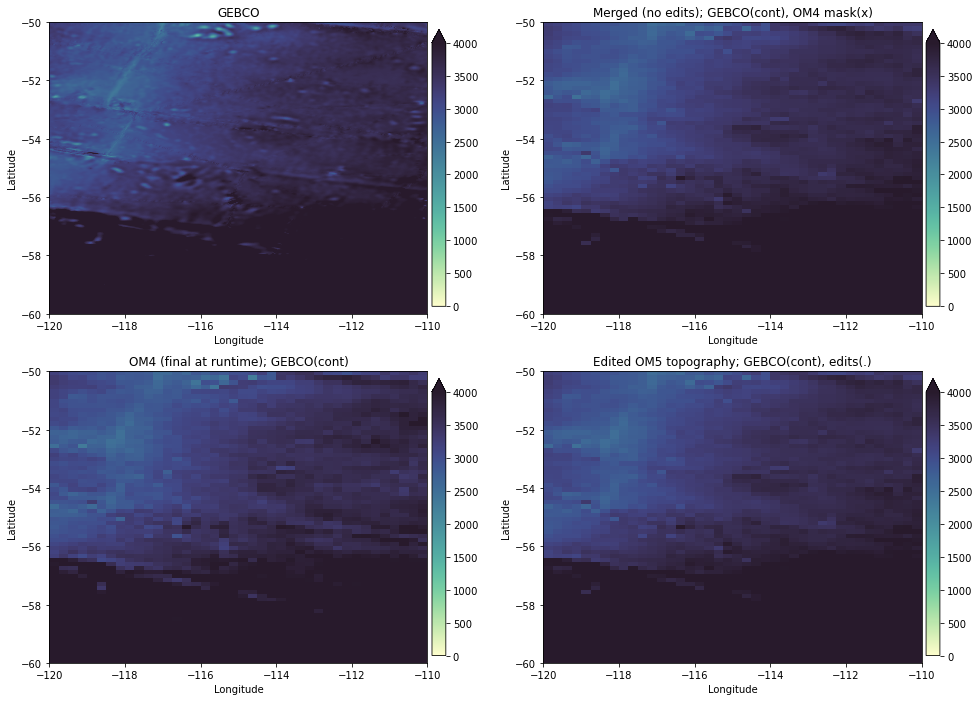

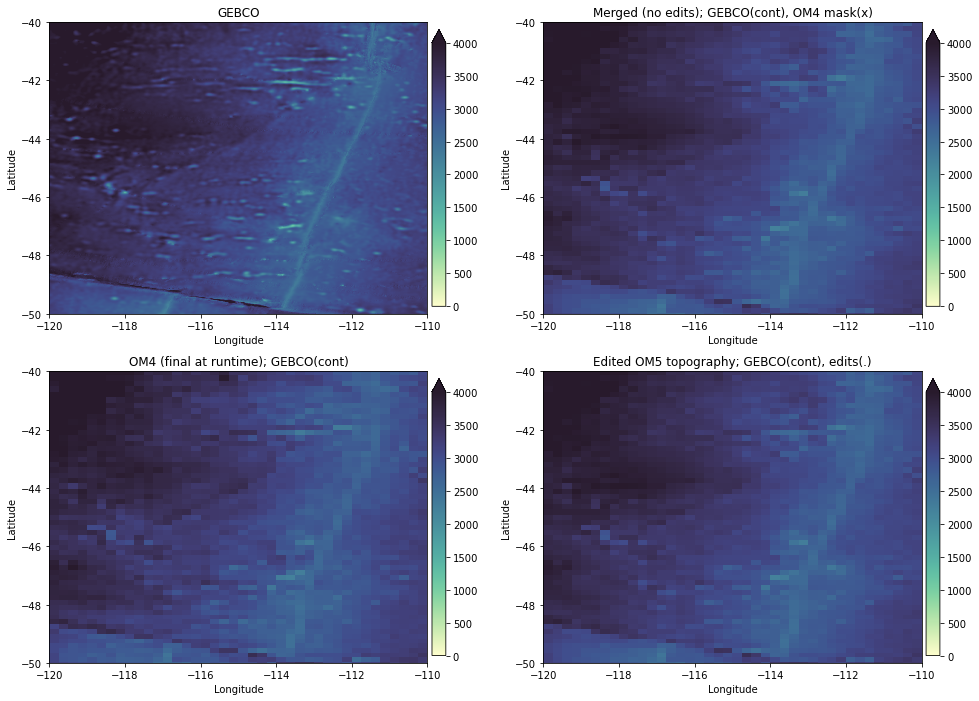

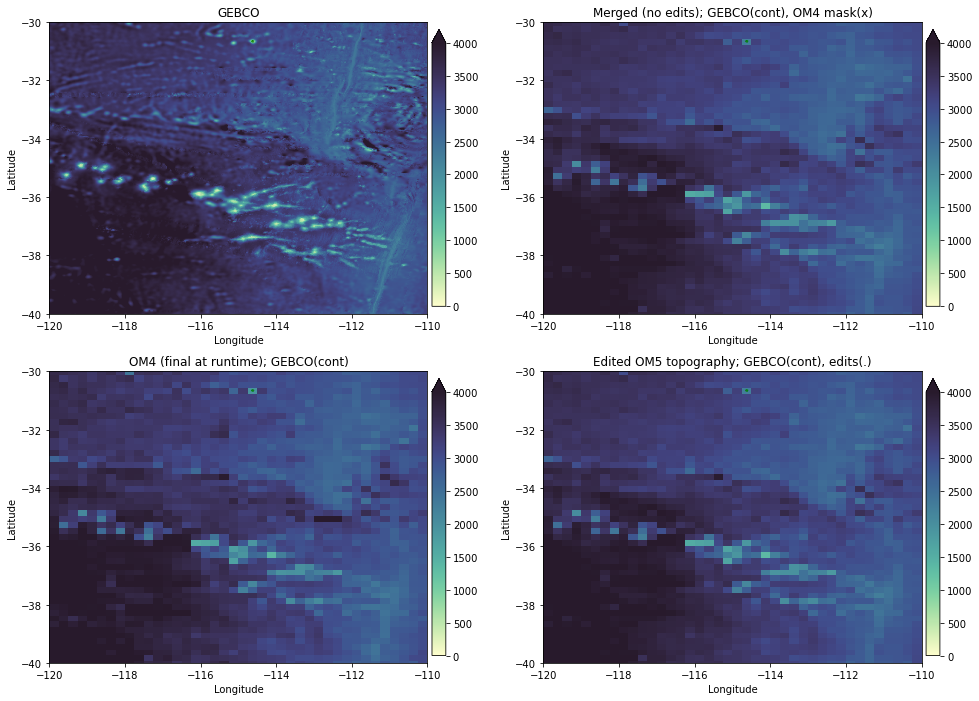

In [24]:
region = Region(-115, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-115, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-115, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,45599:47999
OM4 model (js:je,is:ie) = 200:272,758:800
OM5 model (js:je,is:ie) = 281:353,758:800
Using xlim = (-110.0, -100.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,45599:47999
OM4 model (js:je,is:ie) = 270:329,758:800
OM5 model (js:je,is:ie) = 351:410,758:800
Using xlim = (-110.0, -100.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,45599:47999
OM4 model (js:je,is:ie) = 327:378,758:800
OM5 model (js:je,is:ie) = 408:459,758:800
Using xlim = (-110.0, -100.0) ylim = (-40.0, -30.0)


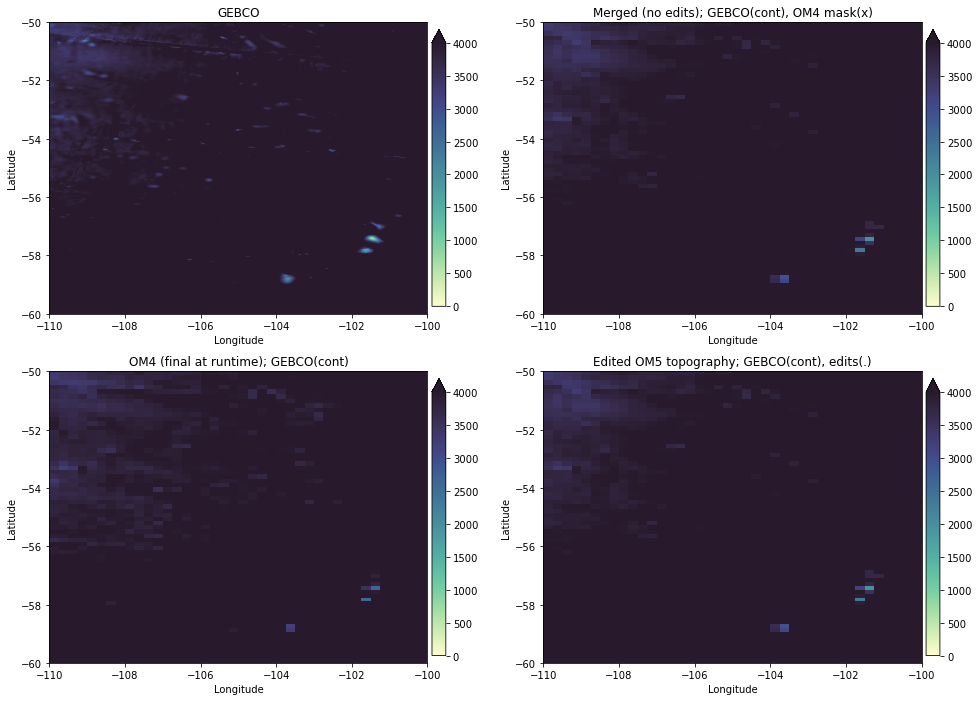

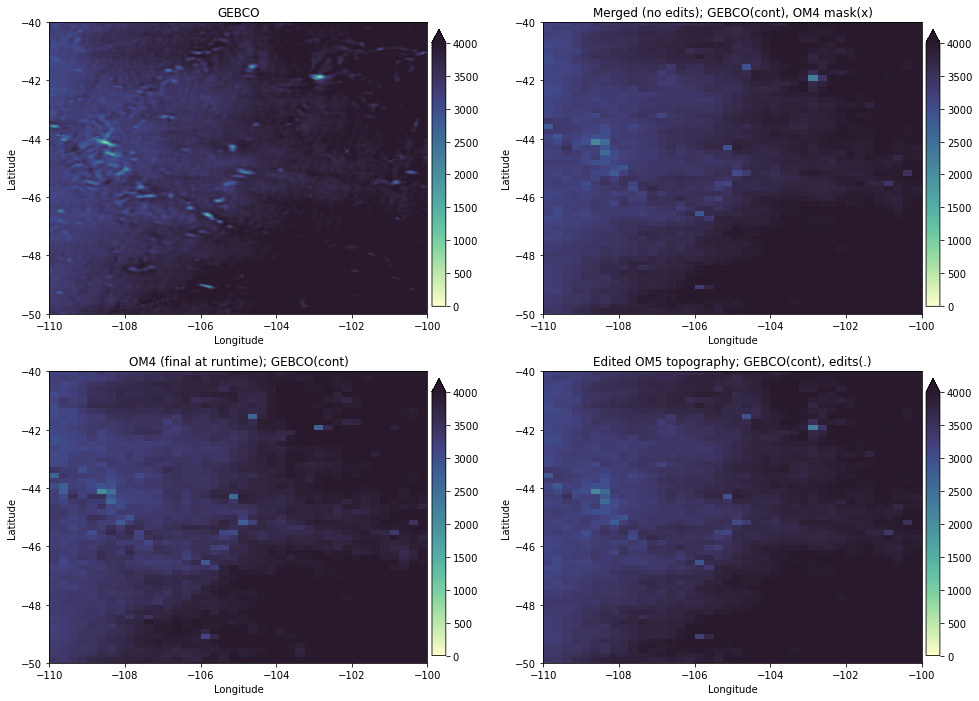

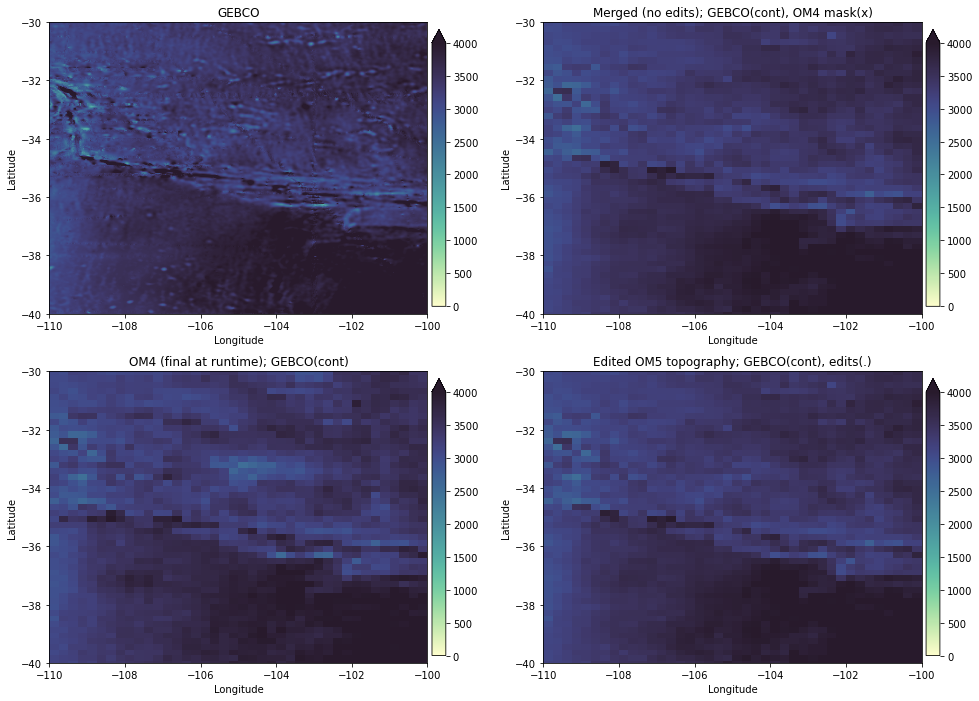

In [25]:
region = Region(-105, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-105, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-105, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

Gebco (js:je,is:ie) = 7199:9599,47999:50399
OM4 model (js:je,is:ie) = 200:272,798:840
OM5 model (js:je,is:ie) = 281:353,798:840
Using xlim = (-100.0, -90.0) ylim = (-60.0, -50.0)
Gebco (js:je,is:ie) = 9599:11999,47999:50399
OM4 model (js:je,is:ie) = 270:329,798:840
OM5 model (js:je,is:ie) = 351:410,798:840
Using xlim = (-100.0, -90.0) ylim = (-50.0, -40.0)
Gebco (js:je,is:ie) = 11999:14399,47999:50399
OM4 model (js:je,is:ie) = 327:378,798:840
OM5 model (js:je,is:ie) = 408:459,798:840
Using xlim = (-100.0, -90.0) ylim = (-40.0, -30.0)


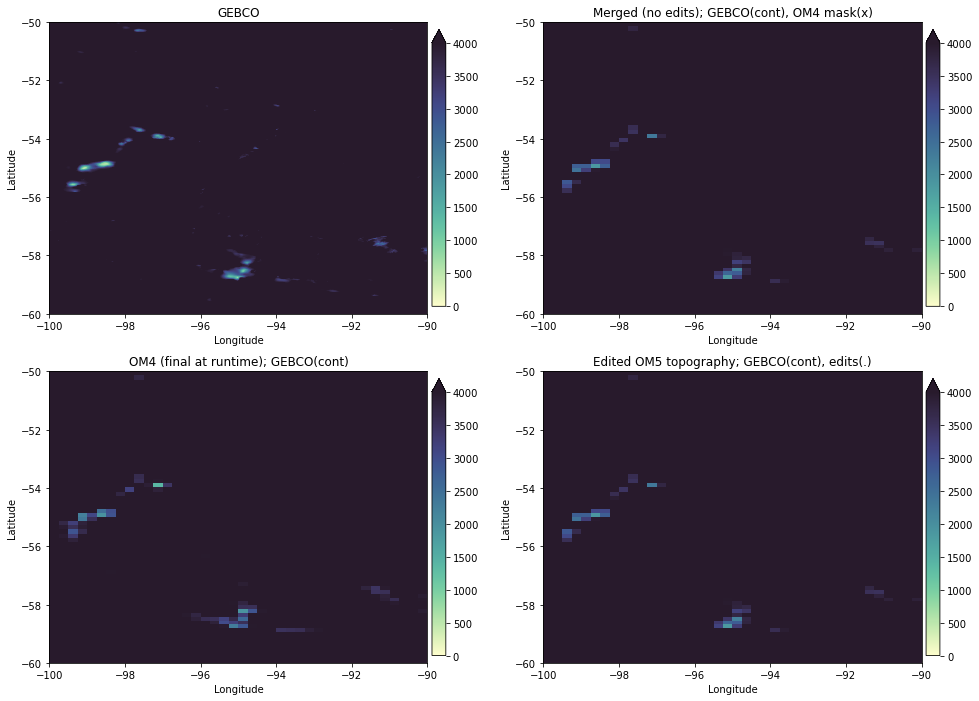

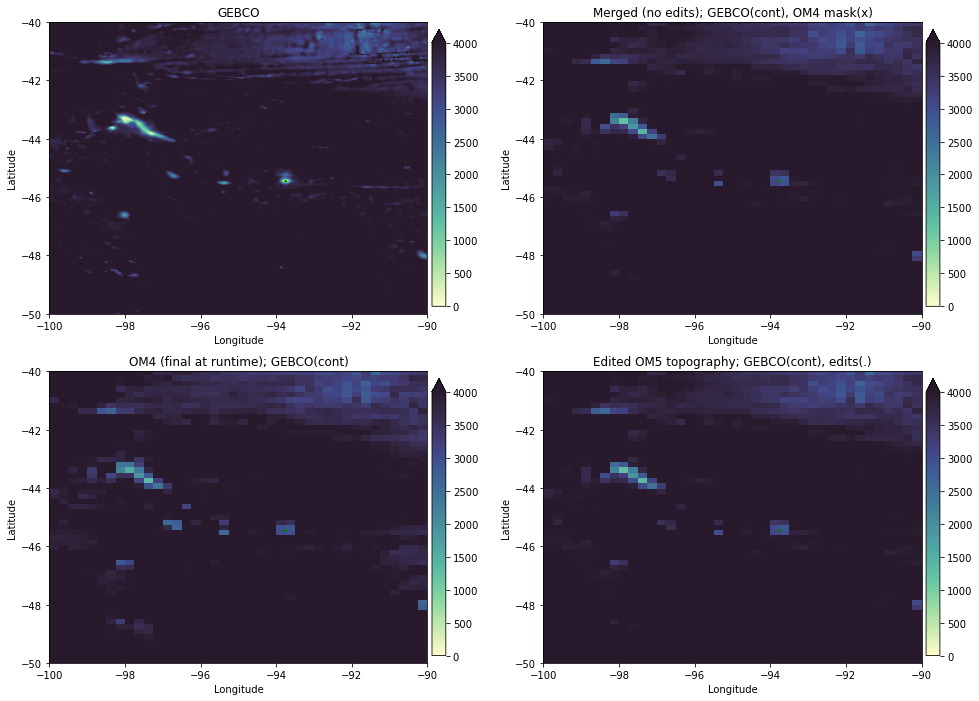

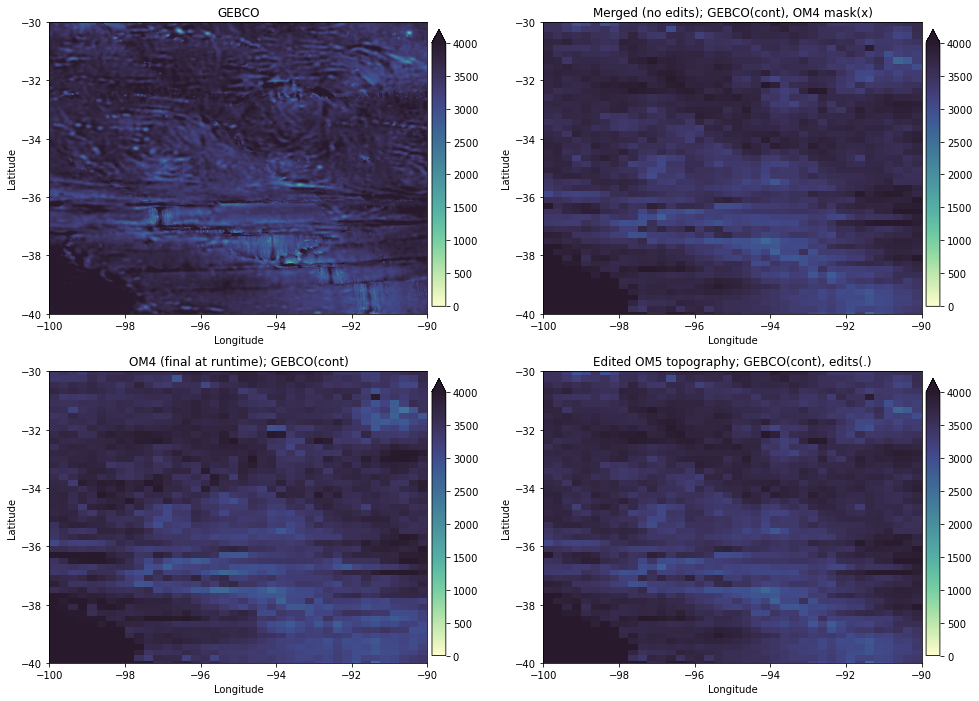

In [26]:
region = Region(-95, -55, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-95, -45, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

region = Region(-95, -35, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);
#No edits needed

In [ ]:
OM5.write_nc("om5_topo_edits_region_05.nc")